In [2]:
import os
import numpy as np
import xarray as xr
import pandas as pd
import seaborn as sns
import geopandas as gpd

import seaborn as sns
import cartopy.crs as ccrs
import cartopy.feature as cf

import scipy.stats as stats
from scipy.stats import linregress

from matplotlib import patches
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.colors as mcolors
from matplotlib.cm import ScalarMappable

## Read RE csv file from DOWN_validation_v2.ipynb
## This code use RE from Dario-QC Data and Mix-data for Marche

In [3]:
lon_min, lon_max, lat_min, lat_max, area, toll = 6.5, 19, 36.5, 48, 'ITALY', 0.002

Tr = [5, 10, 20, 50, 100]

In [4]:
veneto_dir = os.path.join('/','media','arturo','T9','Data','shapes','Europa','Italy')

if os.path.exists(veneto_dir):
    REGIONS = gpd.read_file(os.path.join(veneto_dir,'Italy_regions.geojson'))
    DEM = gpd.read_file(os.path.join(veneto_dir,'DEM','Italy_dem_800.geojson'))   
else:
    raise SystemExit(f"File not found: {veneto_dir}")

# update name of REGIONS geopandas
REGIONS = REGIONS.rename(columns={"reg_name": "Region"})
REGIONS['Region'] = REGIONS['Region'].replace('Emilia Romagna', 'Emilia-Romagna')

In [5]:
# obs_base = os.path.join('/','media','arturo','T9','Data','Italy', 'stations', 'Italy_raingauges', 'QC')
obs_base = os.path.join('/','media','arturo','T9','Data','Italy', 'stations', 'Italy_raingauges', 'QC_MIX')

In [6]:
ISO_names = pd.read_csv(os.path.join('/','media','arturo','T9','Data','Italy', 'stations', 'Italy_raingauges', 'ISO_IT_REGION_EN.csv'))
ISO_names.head(2)

,Region,ISO
0,Alto Adige,IT-322
1,Aosta Valley,IT-230


## Distribution of extreme daily rainfall

In [7]:
dir_base = os.path.join('/','media','arturo','T9','Data','Italy','Satellite','5_DOWN')

In [8]:
data_dir = os.path.join(dir_base, 'ITALY_ENSEMBLE_1dy_2002_2023_npix_2_thr_1_acf_mar_genetic_pearson.nc')
# data_dir = os.path.join(dir_base, 'ITALY_ENSEMBLE_1dy_2002_2023_npix_2_thr_1_acf_mar_genetic_pearson_NOGSMaP.nc')
# data_dir = os.path.join(dir_base, f'ITALY_DOWN_IMERG_1dy_2002_2023_npix_2_thr_1_acf_mar_genetic_pearson.nc')

DATA_Q = xr.open_dataset(data_dir)
DATA_Q = DATA_Q.sel(lat=slice(lat_min, lat_max), lon=slice(lon_min, lon_max))

Tr = DATA_Q.Tr.values

lon2d, lat2d = np.meshgrid(DATA_Q.lon, DATA_Q.lat)

Mev_s = DATA_Q.Mev_s.values
Mev_d = DATA_Q.Mev_d.values

In [9]:
Mev_min = np.min([np.nanmin(Mev_s),np.nanmin(Mev_d)])
Mev_max = np.max([np.nanmax(Mev_s),np.nanmax(Mev_d)])
print(Mev_min, Mev_max)

40.01699572812921 467.7541828883963


/home/arturo/anaconda3/envs/AXE/lib/python3.13/site-packages/cartopy/mpl/feature_artist.py:144: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
/home/arturo/anaconda3/envs/AXE/lib/python3.13/site-packages/cartopy/mpl/feature_artist.py:144: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
/home/arturo/anaconda3/envs/AXE/lib/python3.13/site-packages/cartopy/mpl/feature_artist.py:144: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


Export figure to: ../figures/Article_down/figure4.png


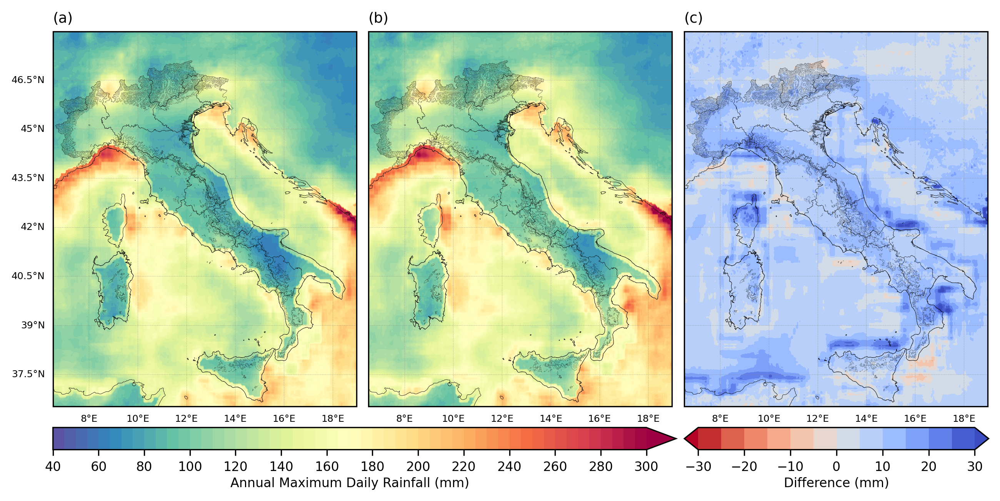

In [10]:
Mev_levels = np.arange(40, 305, 5)
Diff_levels = np.arange(-30, 35, 5)
Mev_ticks = np.arange(40, 320, 20)

Mev_cmap = plt.cm.Spectral_r
Mev_diff = plt.cm.coolwarm_r
proj = ccrs.PlateCarree()

fig = plt.figure(figsize=(9,4),dpi=300)
gs = gridspec.GridSpec(1,3)

# ============================================================================================================================
ax1 = plt.subplot(gs[0, 0], projection = proj)
ax1.add_feature(cf.COASTLINE,linewidth=0.2,color='k')
REGIONS.plot(facecolor='None', ax=ax1, linewidth=0.1, zorder=10)
DEM.plot(facecolor='None', edgecolor='k', ax=ax1, linewidth=0.1, zorder=2, alpha=0.5)

gl = ax1.gridlines(crs=proj,draw_labels=True,linewidth=0.2,color='gray',alpha=0.5,linestyle='--')
gl.top_labels = False
gl.bottom_labels = True
gl.right_labels = False
gl.left_labels =True

gl.xlabel_style = {'size': 6, 'color': 'k'}
gl.ylabel_style = {'size': 6, 'color': 'k'}

a1 = ax1.contourf(lon2d, lat2d, Mev_s[3,:,:], cmap=Mev_cmap, levels=Mev_levels, extend='max')

ax1.set_title(f'(a)', fontsize=9, loc='left')
# ax1.set_title(f'Tr: 50 yrs', fontsize=8, loc='right')

# ============================================================================================================================
ax1 = plt.subplot(gs[0, 1], projection = proj)
ax1.add_feature(cf.COASTLINE,linewidth=0.2,color='k')
REGIONS.plot(facecolor='None', ax=ax1, linewidth=0.1, zorder=10)
DEM.plot(facecolor='None', edgecolor='k', ax=ax1, linewidth=0.1, zorder=2, alpha=0.5)

gl = ax1.gridlines(crs=proj,draw_labels=True,linewidth=0.2,color='gray',alpha=0.5,linestyle='--')
gl.top_labels = False
gl.bottom_labels = True
gl.right_labels = False
gl.left_labels =False

gl.xlabel_style = {'size': 6, 'color': 'k'}
gl.ylabel_style = {'size': 6, 'color': 'k'}

a1 = ax1.contourf(lon2d, lat2d, Mev_d[3,:,:], cmap=Mev_cmap, levels=Mev_levels, extend='max')

ax1.set_title(f'(b)', fontsize=9, loc='left')
# ax1.set_title(f'ERA 5', fontsize=7, loc='right')

# ============================================================================================================================
ax1 = plt.subplot(gs[0, 2], projection = proj)
ax1.add_feature(cf.COASTLINE,linewidth=0.2,color='k')
REGIONS.plot(facecolor='None', ax=ax1, linewidth=0.1, zorder=10)
DEM.plot(facecolor='None', edgecolor='k', ax=ax1, linewidth=0.1, zorder=2, alpha=0.5)

gl = ax1.gridlines(crs=proj,draw_labels=True,linewidth=0.2,color='gray',alpha=0.5,linestyle='--')
gl.top_labels = False
gl.bottom_labels = True
gl.right_labels = False
gl.left_labels =False

gl.xlabel_style = {'size': 6, 'color': 'k'}
gl.ylabel_style = {'size': 6, 'color': 'k'}

a2 = ax1.contourf(lon2d, lat2d, Mev_d[3,:,:]-Mev_s[3,:,:], cmap=Mev_diff, levels=Diff_levels, extend='both')

ax1.set_title(f'(c)', fontsize=9, loc='left')
# ax1.set_title(f'ERA 5', fontsize=7, loc='right')

# ============================================================================================================================
plt.subplots_adjust(left=0.05, bottom=0.05, right=0.95, top=0.95, wspace=0.04, hspace=0.01)

cbar_ax = fig.add_axes([0.05, 0, 0.6, 0.048])#0.96
cbar = fig.colorbar(a1, cax=cbar_ax, orientation='horizontal', ticks=Mev_ticks)
cbar.ax.tick_params(labelsize=8)
cbar.ax.set_xlabel("Annual Maximum Daily Rainfall (mm)", fontsize=8, labelpad=2)

cbar_ax2 = fig.add_axes([0.658, 0, 0.293, 0.048])#0.96
cbar2 = fig.colorbar(a2, cax=cbar_ax2, orientation='horizontal', ticks=None)
cbar2.ax.tick_params(labelsize=8)
cbar2.ax.set_xlabel("Difference (mm)", fontsize=8, labelpad=2)

# ============================================================================================================================
ax1.set_facecolor('white')
fig.patch.set_alpha(0)

salida = os.path.join('..','figures','Article_down','figure4.png')
print(f'Export figure to: {salida}')
# plt.savefig(salida,transparent = False,bbox_inches ='tight',pad_inches = 0.1, facecolor=None)

## Scatter plot of Extreme Quantiles Tr=50yrs

In [11]:
val_remove = 500

In [12]:
def slope_intercept(data1,data2):
    mask = ~np.isnan(data1) & ~np.isnan(data2)
    x = data1[mask]
    y = data2[mask]
    slope, intercept, r_value, p_value, std_err = linregress(x, y)
    x_vals = np.arange(0,550)
    y_vals = slope * x_vals + intercept
    return x_vals, y_vals, slope

In [13]:
dir_in = os.path.join(obs_base, 'DATA_1dy', 'RE_ENSEMBLE_SAT', f'OBS_Q50.csv')
OBS_Q50 = pd.read_csv(dir_in)

dir_in = os.path.join(obs_base, 'DATA_1dy', 'RE_ENSEMBLE_SAT', f'SAT_ensemble_Q50.csv')
SAT_Q50 = pd.read_csv(dir_in)

dir_in = os.path.join(obs_base, 'DATA_1dy', 'RE_ENSEMBLE_SAT', f'DOWN_ensemble_Q50.csv')
DOWN_Q50 = pd.read_csv(dir_in)

In [14]:
OBS_Q50_flat = OBS_Q50.values.flatten()
SAT_Q50_flat = SAT_Q50.values.flatten()
DOWN_Q50_flat = DOWN_Q50.values.flatten()

## Relative Error

In [16]:
dir_in = os.path.join(obs_base, 'DATA_1dy', 'RE_ENSEMBLE_SAT', f'OBS_relative_error_lat.csv')
OBS_RE_LAT = pd.read_csv(dir_in)

dir_in = os.path.join(obs_base, 'DATA_1dy', 'RE_ENSEMBLE_SAT', f'OBS_relative_error_lon.csv')
OBS_RE_LON = pd.read_csv(dir_in)

In [29]:
OBS_Q50_flat_norm = (OBS_Q50_flat-np.nanmin(OBS_Q50_flat))/(np.nanmax(OBS_Q50_flat)-np.nanmin(OBS_Q50_flat))

In [45]:
levels = np.arange(40,520,40)
norm_OBS = mcolors.BoundaryNorm(boundaries=levels, ncolors=256)

In [51]:
levels = np.arange(40,520,20)
norm_OBS = mcolors.BoundaryNorm(boundaries=levels, ncolors=256)

/home/arturo/anaconda3/envs/AXE/lib/python3.13/site-packages/cartopy/mpl/feature_artist.py:144: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


Text(1.0, 1.0, 'Return Time: 50 yrs')

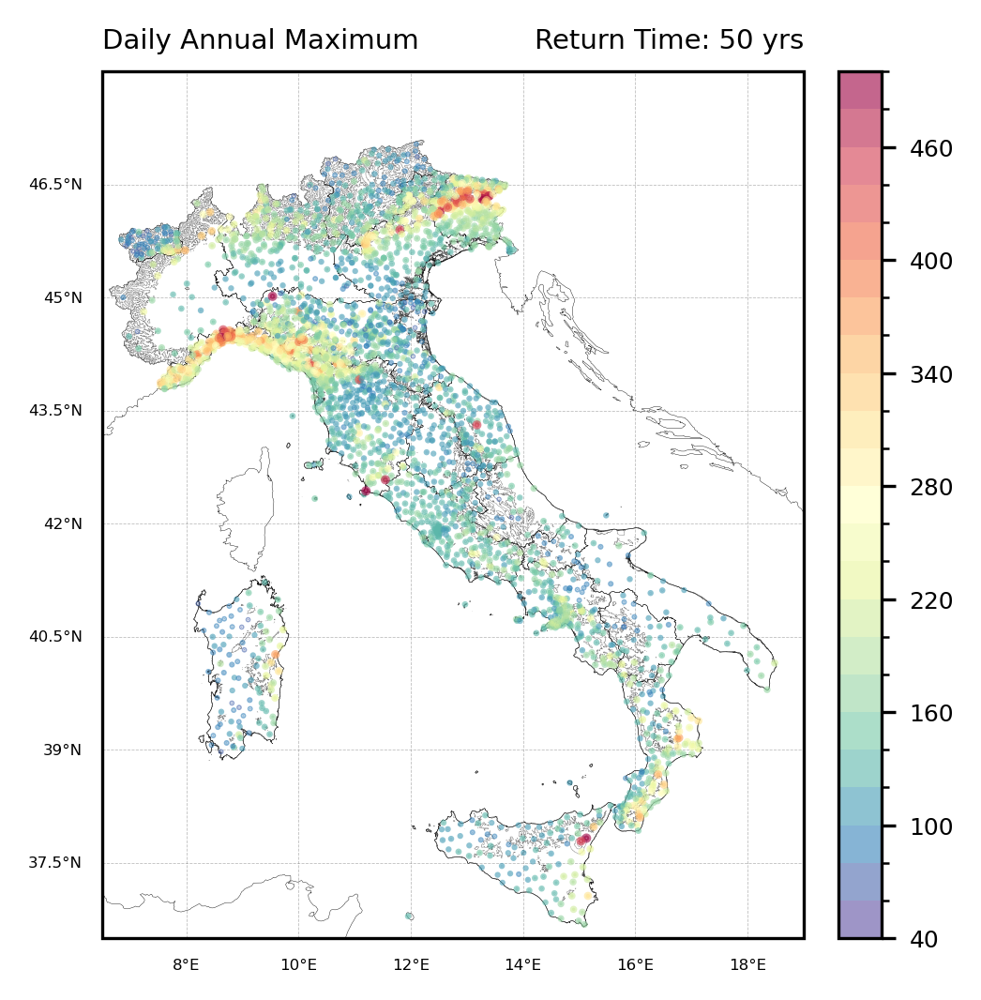

In [59]:
elev_cmap = plt.cm.Spectral_r
proj = ccrs.PlateCarree()

fig = plt.figure(figsize=(4,4),dpi=300)
gs = gridspec.GridSpec(1,1)

# ============================================================================================================================
ax1 = plt.subplot(gs[0, 0], projection = proj)
ax1.set_extent([lon_min, lon_max, lat_min, lat_max], crs=proj)
ax1.add_feature(cf.COASTLINE,linewidth=0.1,color='k')
REGIONS.plot(facecolor='None', ax=ax1, linewidth=0.1, zorder=10)
DEM.plot(facecolor='None', edgecolor='k', ax=ax1, linewidth=0.1, zorder=2, alpha=0.5)

a1 = ax1.scatter(OBS_RE_LON.values.flatten(), OBS_RE_LAT.values.flatten(), 
                    c=OBS_Q50_flat, 
                    cmap=elev_cmap, 
                    s=OBS_Q50_flat_norm*2, 
                    alpha=0.6, 
                    norm=norm_OBS, 
                    zorder=20)

gl = ax1.gridlines(crs=proj,draw_labels=True,linewidth=0.2,color='gray',alpha=0.5,linestyle='--')
gl.top_labels = False
gl.bottom_labels = True
gl.right_labels = False
gl.left_labels = True

gl.xlabel_style = {'size': 4, 'color': 'k'}
gl.ylabel_style = {'size': 4, 'color': 'k'}

cbar = plt.colorbar(a1, ax=ax1, fraction=0.056, pad=0.04)
cbar.ax.tick_params(labelsize=6) 

ax1.set_title('Daily Annual Maximum', fontsize=7, loc='left')
ax1.set_title('Return Time: 50 yrs', fontsize=7, loc='right')

In [25]:
dir_in = os.path.join(obs_base, 'DATA_1dy', 'RE_ENSEMBLE_SAT', f'SAT_ensemble_relative_error.csv')
SAT_RE = pd.read_csv(dir_in)

In [22]:
dir_in = os.path.join(obs_base, 'DATA_1dy', 'RE_ENSEMBLE_SAT', f'DOWN_ensemble_relative_error.csv')
DOWN_RE = pd.read_csv(dir_in)

In [26]:
OBS_Q50 = OBS_Q50[(DOWN_RE>-1)&(DOWN_RE<1)]
SAT_Q50 = SAT_Q50[(DOWN_RE>-1)&(DOWN_RE<1)]
DOWN_Q50 = DOWN_Q50[(DOWN_RE>-1)&(DOWN_RE<1)]

SAT_RE = SAT_RE[(DOWN_RE>-1)&(DOWN_RE<1)]
DOWN_RE = DOWN_RE[(DOWN_RE>-1)&(DOWN_RE<1)]

In [27]:
SAT_RE = SAT_RE[~np.isnan(OBS_Q50)]
DOWN_RE = DOWN_RE[~np.isnan(OBS_Q50)]
OBS_RE_LAT = OBS_RE_LAT[~np.isnan(OBS_Q50)]
OBS_RE_LON = OBS_RE_LON[~np.isnan(OBS_Q50)]

In [28]:
SAT_RE_flat = SAT_RE.values.flatten()*100
DOWN_RE_flat = DOWN_RE.values.flatten()*100

In [29]:
# SAT_RE_flat = SAT_RE_flat[OBS_Q50_flat<val_remove]
# DOWN_RE_flat = DOWN_RE_flat[OBS_Q50_flat<val_remove]

# SAT_Q50_flat = SAT_Q50_flat[OBS_Q50_flat<val_remove]
# DOWN_Q50_flat = DOWN_Q50_flat[OBS_Q50_flat<val_remove]
# OBS_Q50_flat = OBS_Q50_flat[OBS_Q50_flat<val_remove]

In [30]:
OBS_SAT_x, OBS_SAT_y, OBS_SAT_slope = slope_intercept(OBS_Q50_flat, SAT_Q50_flat)
OBS_DOWN_x, OBS_DOWN_y, OBS_DOWN_slope = slope_intercept(OBS_Q50_flat, DOWN_Q50_flat)

Export figure to: ../figures/Article_down/figure5.png


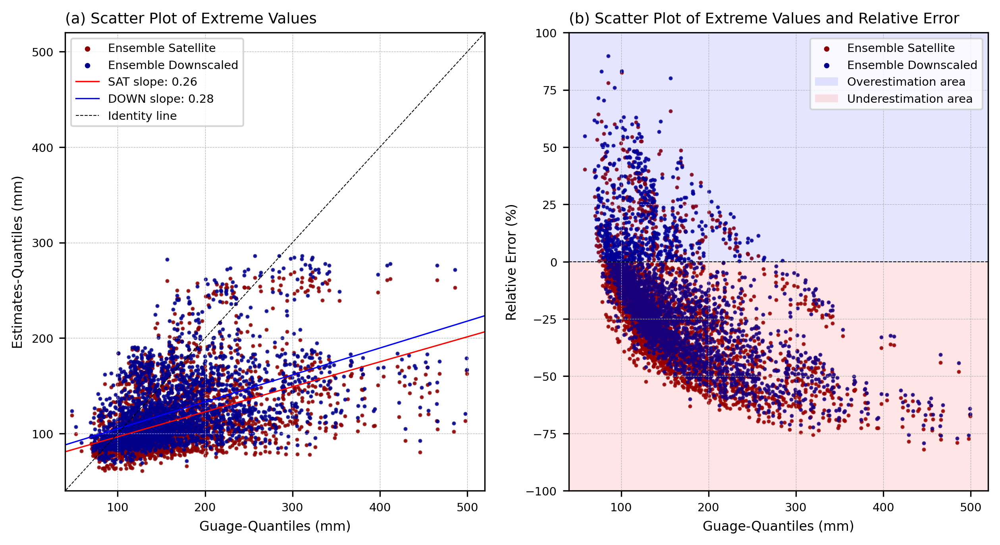

In [31]:
fig = plt.figure(figsize=(10,5),dpi=300)
gs = gridspec.GridSpec(1,2)

# ============================================================================================================================
ax1 = plt.subplot(gs[0, 0])

ax1.scatter([],[], s=5, c='darkred', label='Ensemble Satellite')
ax1.scatter([],[], s=5, c='darkblue', label='Ensemble Downscaled')

ax1.scatter(OBS_Q50_flat,SAT_Q50_flat, alpha=0.8, s=2, c='darkred')
ax1.scatter(OBS_Q50_flat,DOWN_Q50_flat, alpha=0.8, s=2, c='darkblue')

ax1.plot(OBS_SAT_x, OBS_SAT_y, color="r", linewidth=0.8, label=f"SAT slope: {np.round(OBS_SAT_slope,2)}")
ax1.plot(OBS_DOWN_x, OBS_DOWN_y, color="b", linewidth=0.8, label=f"DOWN slope: {np.round(OBS_DOWN_slope,2)}")

ax1.plot(np.arange(val_remove+20),np.arange(val_remove+20),'--k', linewidth=0.5, label='Identity line')

ax1.set_xlim(40,val_remove+20)
ax1.set_ylim(40,val_remove+20)

ax1.grid(linewidth=0.3, linestyle='--')
ax1.tick_params(axis='both', which='major', labelsize=7)
ax1.legend(fontsize=7, loc=2, ncol=1)

ax1.set_xlabel('Guage-Quantiles (mm)',fontsize=8)
ax1.set_ylabel('Estimates-Quantiles (mm)',fontsize=8)
ax1.set_title('(a) Scatter Plot of Extreme Values', loc='left', fontsize=9)

# ============================================================================================================================
ax1 = plt.subplot(gs[0, 1])

ax1.scatter(OBS_Q50_flat,SAT_RE_flat, alpha=0.8, s=2, c='darkred')
ax1.scatter(OBS_Q50_flat,DOWN_RE_flat, alpha=0.8, s=2, c='darkblue')

ax1.scatter([],[], s=5, c='darkred', label='Ensemble Satellite')
ax1.scatter([],[], s=5, c='darkblue', label='Ensemble Downscaled')

ax1.axhline(y=0, color="black", linestyle="--", linewidth=0.5)

ax1.axhspan(0, 100, facecolor="blue", alpha=0.1, label='Overestimation area')
ax1.axhspan(-100, 0, facecolor="red", alpha=0.1, label='Underestimation area')

ax1.set_xlim(40,val_remove+20)
ax1.set_ylim(-100,100)

ax1.grid(linewidth=0.3, linestyle='--')
ax1.tick_params(axis='both', which='major', labelsize=7)
ax1.legend(fontsize=7, loc=0, ncol=1)

ax1.set_xlabel('Guage-Quantiles (mm)',fontsize=8)
ax1.set_ylabel('Relative Error (%)',fontsize=8) 
ax1.set_title('(b) Scatter Plot of Extreme Values and Relative Error', loc='left', fontsize=9)

# ============================================================================================================================
salida = os.path.join('..','figures','Article_down','figure5.png')
print(f'Export figure to: {salida}')
# plt.savefig(salida,transparent = False,bbox_inches ='tight',pad_inches = 0.1, facecolor=None)

## Elevation Analysis

In [32]:
dir_in = os.path.join(obs_base, 'DATA_1dy', 'RE_ENSEMBLE_SAT', f'OBS_elev.csv')
OBS_ELEV = pd.read_csv(dir_in)

ELEV_ref = OBS_ELEV.values.flatten()
LON_ref = OBS_RE_LON.values.flatten()
LAT_ref = OBS_RE_LAT.values.flatten()

Text(0, 0.5, 'Estimates-Quantiles (mm)')

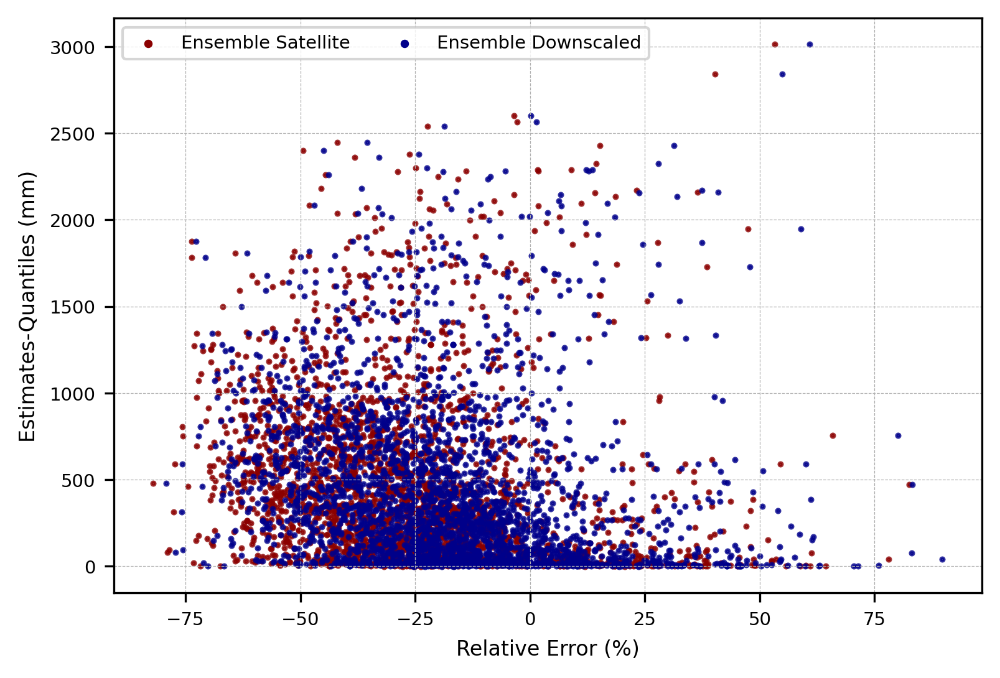

In [33]:
fig = plt.figure(figsize=(6,4),dpi=300)
gs = gridspec.GridSpec(1,1)

# ============================================================================================================================
ax1 = plt.subplot(gs[0, 0])
ax1.scatter(SAT_RE_flat,ELEV_ref, alpha=0.8, s=2, c='darkred')
ax1.scatter(DOWN_RE_flat,ELEV_ref, alpha=0.8, s=2, c='darkblue')

ax1.scatter([],[], s=5, c='darkred', label='Ensemble Satellite')
ax1.scatter([],[], s=5, c='darkblue', label='Ensemble Downscaled')

# ax1.axhspan(0, 100, facecolor="blue", alpha=0.1, label='Overestimation area')
# ax1.axhspan(-100, 0, facecolor="red", alpha=0.1, label='Underestimation area')

ax1.grid(linewidth=0.3, linestyle='--')
ax1.tick_params(axis='both', which='major', labelsize=7)
ax1.legend(fontsize=7, loc=2, ncol=2)
# ax1.set_xlim(-100,100)

ax1.set_xlabel('Relative Error (%)',fontsize=8) 
ax1.set_ylabel('Estimates-Quantiles (mm)',fontsize=8)

In [48]:
# elev_min, elev_max = 100, 1000
# elev_min, elev_max = 500, 1000
elev_min, elev_max = 0, 30
# elev_min, elev_max = 2400, 2500

elev_pos = np.where((ELEV_ref>=elev_min)&(ELEV_ref<elev_max))

In [49]:
pos_frac = (len(DOWN_RE_flat[elev_pos][DOWN_RE_flat[elev_pos]>0])/len(DOWN_RE_flat[elev_pos]))*100
neg_frac = (len(DOWN_RE_flat[elev_pos][DOWN_RE_flat[elev_pos]<0])/len(DOWN_RE_flat[elev_pos]))*100

Text(0.0, 1.0, 'Elevation interval: 0m to 30m')

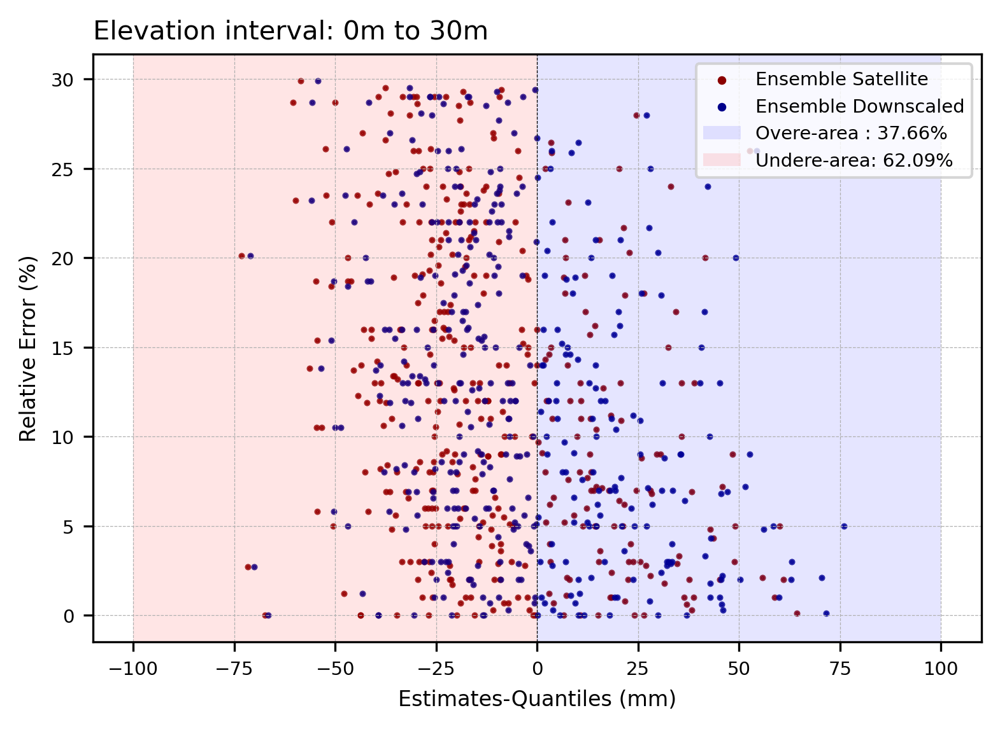

In [50]:
fig = plt.figure(figsize=(6,4),dpi=300)
gs = gridspec.GridSpec(1,1)

# ============================================================================================================================
ax1 = plt.subplot(gs[0, 0])
ax1.axvline(x=0, color="k", linestyle="--", linewidth=0.3)
ax1.scatter(SAT_RE_flat[elev_pos],ELEV_ref[elev_pos], alpha=0.8, s=2, c='darkred')
ax1.scatter(DOWN_RE_flat[elev_pos],ELEV_ref[elev_pos], alpha=0.8, s=2, c='darkblue')

ax1.scatter([],[], s=5, c='darkred', label='Ensemble Satellite')
ax1.scatter([],[], s=5, c='darkblue', label='Ensemble Downscaled')

ax1.axvspan(0, 100, facecolor="blue", alpha=0.1, label=f'Overe-area : {np.round(pos_frac,2)}%')
ax1.axvspan(-100, 0, facecolor="red", alpha=0.1, label=f'Undere-area: {np.round(neg_frac,2)}%')

ax1.grid(linewidth=0.3, linestyle='--')
ax1.tick_params(axis='both', which='major', labelsize=7)
ax1.legend(fontsize=7, loc=0, ncol=1)
# ax1.set_xlim(-100,100)

ax1.set_ylabel('Relative Error (%)',fontsize=8) 
ax1.set_xlabel('Estimates-Quantiles (mm)',fontsize=8)

ax1.set_title(f'Elevation interval: {elev_min}m to {elev_max}m', loc='left', fontsize=10)

# ============================================================================================================================


## Proportion for diferentes Elevation levels

In [37]:
elev_min_list = [0, 10, 50, 100, 200, 500, 800, 1200, 1600, 2000]
elev_max_list = [10, 50, 100, 200, 500, 800, 1200, 1600, 2000, 2500]
for nn in range(len(elev_max_list)):
    elev_pos = np.where((ELEV_ref>=elev_min_list[nn])&(ELEV_ref<elev_max_list[nn]))
    pos_frac = (len(DOWN_RE_flat[elev_pos][DOWN_RE_flat[elev_pos]>0])/len(DOWN_RE_flat[elev_pos]))*100
    neg_frac = (len(DOWN_RE_flat[elev_pos][DOWN_RE_flat[elev_pos]<0])/len(DOWN_RE_flat[elev_pos]))*100
    

In [51]:
inc = 30

# elev_min_list = [0, 10, 50, 100, 200, 500, 800, 1200, 1600, 2000]
# elev_max_list = [10, 50, 100, 200, 500, 800, 1200, 1600, 2000, 2500]
elev_min_list = np.arange(0,2500,inc)
elev_max_list = np.arange(inc,2500+inc,inc)

pos_fracs = []
neg_fracs = []
total_est = []
labels = []

for nn in range(len(elev_max_list)):
    elev_pos = np.where((ELEV_ref >= elev_min_list[nn]) & (ELEV_ref < elev_max_list[nn]))
    pos_frac = (np.sum(DOWN_RE_flat[elev_pos] > 0) / len(DOWN_RE_flat[elev_pos])) * 100
    neg_frac = (np.sum(DOWN_RE_flat[elev_pos] < 0) / len(DOWN_RE_flat[elev_pos])) * 100
    
    total_est.append(len(DOWN_RE_flat[elev_pos]))
    pos_fracs.append(pos_frac)
    neg_fracs.append(neg_frac)
    labels.append(f"{elev_min_list[nn]}-{elev_max_list[nn]}")
    
    if nn == len(elev_max_list)-1:
        elev_pos = np.where((ELEV_ref >= elev_min_list[nn]) & (ELEV_ref < elev_max_list[nn]))
        pos_frac = (np.sum(DOWN_RE_flat[elev_pos] > 0) / len(DOWN_RE_flat[elev_pos])) * 100
        neg_frac = (np.sum(DOWN_RE_flat[elev_pos] < 0) / len(DOWN_RE_flat[elev_pos])) * 100

        total_est.append(len(DOWN_RE_flat[elev_pos]))
        pos_fracs.append(pos_frac)
        neg_fracs.append(neg_frac)
        labels.append(f"{elev_min_list[nn]}-{elev_max_list[nn]}")

        elev_pos = np.where(ELEV_ref >= elev_max_list[nn])
        pos_frac = (np.sum(DOWN_RE_flat[elev_pos] > 0) / len(DOWN_RE_flat[elev_pos])) * 100
        neg_frac = (np.sum(DOWN_RE_flat[elev_pos] < 0) / len(DOWN_RE_flat[elev_pos])) * 100

        total_est.append(len(DOWN_RE_flat[elev_pos]))
        pos_fracs.append(pos_frac)
        neg_fracs.append(neg_frac)
        labels.append(f"2500")

/tmp/ipykernel_7683/318862044.py:15: RuntimeWarning: invalid value encountered in scalar divide
  pos_frac = (np.sum(DOWN_RE_flat[elev_pos] > 0) / len(DOWN_RE_flat[elev_pos])) * 100
/tmp/ipykernel_7683/318862044.py:16: RuntimeWarning: invalid value encountered in scalar divide
  neg_frac = (np.sum(DOWN_RE_flat[elev_pos] < 0) / len(DOWN_RE_flat[elev_pos])) * 100
/tmp/ipykernel_7683/318862044.py:25: RuntimeWarning: invalid value encountered in scalar divide
  pos_frac = (np.sum(DOWN_RE_flat[elev_pos] > 0) / len(DOWN_RE_flat[elev_pos])) * 100
/tmp/ipykernel_7683/318862044.py:26: RuntimeWarning: invalid value encountered in scalar divide
  neg_frac = (np.sum(DOWN_RE_flat[elev_pos] < 0) / len(DOWN_RE_flat[elev_pos])) * 100


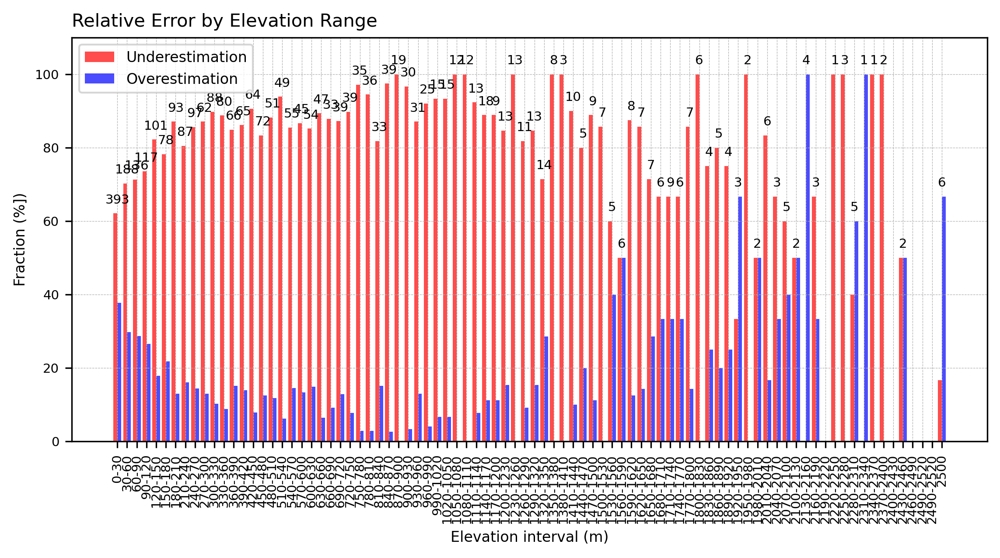

In [52]:
x = np.arange(len(labels))
width = 0.8

fig = plt.figure(figsize=(9,4),dpi=300)
gs = gridspec.GridSpec(1,1)

# ============================================================================================================================
ax1 = plt.subplot(gs[0, 0])
bars1 = ax1.bar(2*x - width/2, neg_fracs, width, color="red", alpha=0.7, label="Underestimation")
bars2 = ax1.bar(2*x + width/2, pos_fracs, width, color="blue", alpha=0.7, label="Overestimation")

for i, val in enumerate(total_est):
    xpos = 2*(x[i])                       # centro del grupo (entre las dos barras)
    ypos = max(neg_fracs[i], pos_fracs[i]) + 2  # un poco arriba de la barra más alta
    ax1.text(
        xpos, ypos, str(val),
        ha="center", va="bottom",
        fontsize=7, color="black"
    )

ax1.set_xticks(2*np.arange(len(labels)))
ax1.tick_params(axis='both', which='major', labelsize=7)
ax1.set_xticklabels(labels, rotation=90, fontsize=7)
ax1.set_ylabel("Fraction (%])",fontsize=8)
ax1.set_xlabel("Elevation interval (m)",fontsize=8)
ax1.set_title("Relative Error by Elevation Range", loc='left',fontsize=10)
ax1.legend(fontsize=8)

ax1.set_ylim(0,110)
ax1.grid(linewidth=0.3, linestyle='--')

## Boxplot in relation to Elevation

In [31]:
levels_filter = [10, 50, 100, 500, 1000, 1500, 2000]
# levels_filter_labels = (['<10','>=10 & <50','>=50 & <100','>=100 & <500','>=500 & <1000','>=1000 & <1500','>=2000'])
levels_filter_labels = [r"$< 10$", r"$10 \leq x < 50$",r"$50 \leq x < 100$",r"$100 \leq x < 500$",r"$500 \leq x < 1000$",r"$1000 \leq x < 1500$",r"$1500 \leq x < 200$",r"$\geq 2000$"]

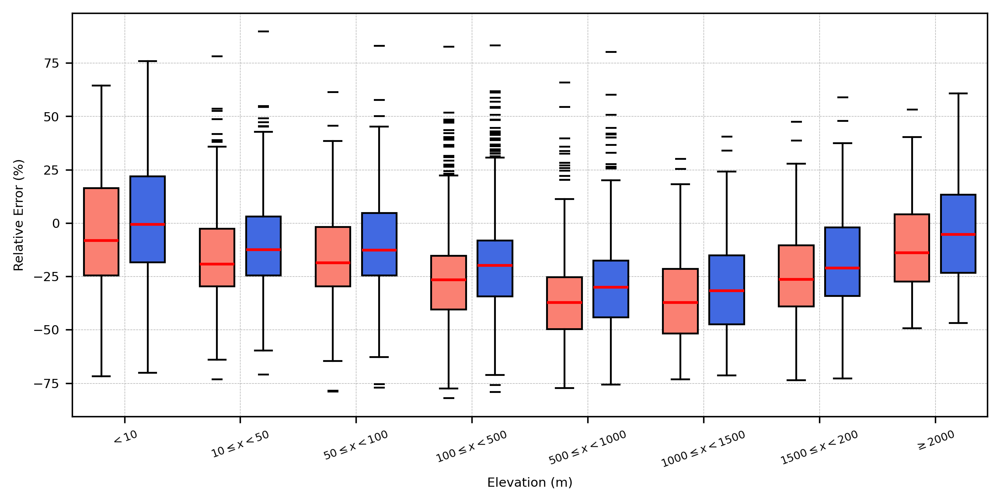

In [32]:
box_width = 0.6

fig = plt.figure(figsize=(9,4),dpi=300)
gs = gridspec.GridSpec(1,1)

# ============================================================================================================================
ax1 = plt.subplot(gs[0, 0])

SAT_boxprops = dict(facecolor='salmon')
DOWN_boxprops = dict(facecolor='royalblue')

meanprops=dict(linestyle='-',color="g",linewidth=1.5)
flierprops = dict(marker='_',markeredgecolor='k',linewidth=1.5)
medianprops = dict(linestyle='-', linewidth=1.5, color='r')

SAT_boxes = []
DOWN_boxes = []
medians = []
fliers = []

for ll in np.arange(len(levels_filter)):
    if ll == 0:
        SAT_elev_tmp = SAT_RE[OBS_ELEV<levels_filter[ll]].values
        SAT_elev_tmp = SAT_elev_tmp[~np.isnan(SAT_elev_tmp)]*100

        SAT_box = ax1.boxplot(SAT_elev_tmp,positions=[2*ll],
        widths=box_width,boxprops=SAT_boxprops,
        showmeans=False,meanline=True,meanprops=meanprops,
        medianprops=medianprops,
        showfliers=True,flierprops=flierprops,
        patch_artist=True,notch=False)

        DOWN_elev_tmp = DOWN_RE[OBS_ELEV<levels_filter[ll]].values
        DOWN_elev_tmp = DOWN_elev_tmp[~np.isnan(DOWN_elev_tmp)]*100

        DOWN_box = ax1.boxplot(DOWN_elev_tmp,positions=[2*ll+0.8],
        widths=box_width,boxprops=DOWN_boxprops,
        showmeans=False,meanline=True,meanprops=meanprops,
        medianprops=medianprops,
        showfliers=True,flierprops=flierprops,
        patch_artist=True,notch=False)

    elif ll == len(levels_filter)-1:
        SAT_elev_tmp = SAT_RE[(OBS_ELEV>=levels_filter[ll-1])&(OBS_ELEV<levels_filter[ll])].values
        SAT_elev_tmp = SAT_elev_tmp[~np.isnan(SAT_elev_tmp)]*100

        SAT_box = ax1.boxplot(SAT_elev_tmp,positions=[2*ll],
        widths=box_width,boxprops=SAT_boxprops,
        showmeans=False,meanline=True,meanprops=meanprops,
        medianprops=medianprops,
        showfliers=True,flierprops=flierprops,
        patch_artist=True,notch=False)

        DOWN_elev_tmp = DOWN_RE[(OBS_ELEV>=levels_filter[ll-1])&(OBS_ELEV<levels_filter[ll])].values
        DOWN_elev_tmp = DOWN_elev_tmp[~np.isnan(DOWN_elev_tmp)]*100

        DOWN_box = ax1.boxplot(DOWN_elev_tmp,positions=[2*ll+0.8],
        widths=box_width,boxprops=DOWN_boxprops,
        showmeans=False,meanline=True,meanprops=meanprops,
        medianprops=medianprops,
        showfliers=True,flierprops=flierprops,
        patch_artist=True,notch=False)
        
        SAT_elev_tmp = SAT_RE[OBS_ELEV>=levels_filter[ll]].values
        SAT_elev_tmp = SAT_elev_tmp[~np.isnan(SAT_elev_tmp)]*100

        SAT_box = ax1.boxplot(SAT_elev_tmp,positions=[2*(ll+1)],
        widths=box_width,boxprops=SAT_boxprops,
        showmeans=False,meanline=True,meanprops=meanprops,
        medianprops=medianprops,
        showfliers=True,flierprops=flierprops,
        patch_artist=True,notch=False)
        
        DOWN_elev_tmp = DOWN_RE[OBS_ELEV>=levels_filter[ll]].values
        DOWN_elev_tmp = DOWN_elev_tmp[~np.isnan(DOWN_elev_tmp)]*100

        DOWN_box = ax1.boxplot(DOWN_elev_tmp,positions=[2*(ll+1)+0.8],
        widths=box_width,boxprops=DOWN_boxprops,
        showmeans=False,meanline=True,meanprops=meanprops,
        medianprops=medianprops,
        showfliers=True,flierprops=flierprops,
        patch_artist=True,notch=False)

    else:
        SAT_elev_tmp = SAT_RE[(OBS_ELEV>=levels_filter[ll-1])&(OBS_ELEV<levels_filter[ll])].values
        SAT_elev_tmp = SAT_elev_tmp[~np.isnan(SAT_elev_tmp)]*100

        SAT_box = ax1.boxplot(SAT_elev_tmp,positions=[2*ll],
        widths=box_width,boxprops=SAT_boxprops,
        showmeans=False,meanline=True,meanprops=meanprops,
        medianprops=medianprops,
        showfliers=True,flierprops=flierprops,
        patch_artist=True,notch=False)

        DOWN_elev_tmp = DOWN_RE[(OBS_ELEV>=levels_filter[ll-1])&(OBS_ELEV<levels_filter[ll])].values
        DOWN_elev_tmp = DOWN_elev_tmp[~np.isnan(DOWN_elev_tmp)]*100

        DOWN_box = ax1.boxplot(DOWN_elev_tmp,positions=[2*ll+0.8],
        widths=box_width,boxprops=DOWN_boxprops,
        showmeans=False,meanline=True,meanprops=meanprops,
        medianprops=medianprops,
        showfliers=True,flierprops=flierprops,
        patch_artist=True,notch=False)

ax1.grid(linewidth=0.3, linestyle='--')

ax1.set_xticks(np.arange(0.4,(len(levels_filter)+1)*2,2))
ax1.set_xticklabels(levels_filter_labels)

ax1.tick_params(axis='both', which='major', labelsize=7)
ax1.set_ylabel('Relative Error (%)', fontsize=7)
ax1.set_xlabel('Elevation (m)', fontsize=7)
# ax1.set_ylim(-100,100)
ax1.tick_params(axis='x', which='major', labelsize=6, rotation=20) 


## Violin plot

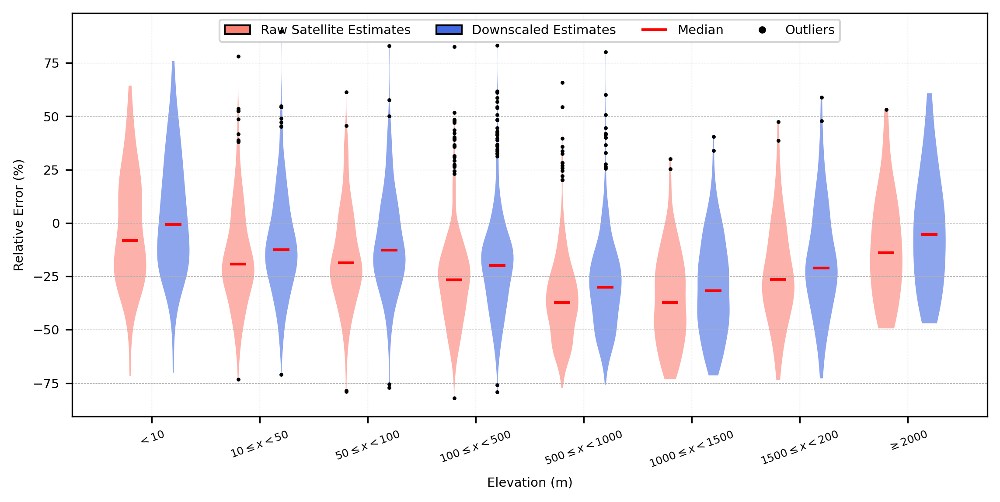

In [33]:
SAT_color = "salmon"
DOWN_color = "royalblue"
SAT_bodies = []
DOWN_bodies = []

fig = plt.figure(figsize=(9,4),dpi=300)
gs = gridspec.GridSpec(1,1)

# ============================================================================================================================
ax1 = plt.subplot(gs[0, 0])

SAT_boxprops = dict(facecolor='salmon')
DOWN_boxprops = dict(facecolor='royalblue')

meanprops=dict(linestyle='-',color="g",linewidth=1.5)
flierprops = dict(marker='_',markeredgecolor='k',linewidth=1.5)
medianprops = dict(linestyle='-', linewidth=1.5, color='r')

SAT_boxes = []
DOWN_boxes = []
medians = []
fliers = []

for ll in np.arange(len(levels_filter)):
    if ll == 0:
        SAT_elev_tmp = SAT_RE[OBS_ELEV<levels_filter[ll]].values
        SAT_elev_tmp = SAT_elev_tmp[~np.isnan(SAT_elev_tmp)]*100

        SAT_vio = ax1.violinplot(SAT_elev_tmp, positions=[2*ll], widths=box_width,
                            showmeans=False, showextrema=False, showmedians=True)
        
        for b in SAT_vio['bodies']:
            b.set_facecolor(SAT_color)
            b.set_alpha(0.6)
        SAT_vio['cmedians'].set_color("r")
        SAT_bodies.append(SAT_vio['bodies'][0])
        
        Q1 = np.percentile(SAT_elev_tmp, 25)
        Q3 = np.percentile(SAT_elev_tmp, 75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        outliers_SAT = SAT_elev_tmp[(SAT_elev_tmp < lower_bound) | (SAT_elev_tmp > upper_bound)]
        ax1.scatter(np.repeat(2*ll, len(outliers_SAT)), outliers_SAT,
                    color="k", marker=".", s=5, zorder=20, label="Outliers" if ll==0 else "")

        DOWN_elev_tmp = DOWN_RE[OBS_ELEV<levels_filter[ll]].values
        DOWN_elev_tmp = DOWN_elev_tmp[~np.isnan(DOWN_elev_tmp)]*100

        DOWN_vio = ax1.violinplot(DOWN_elev_tmp, positions=[2*ll+0.8], widths=box_width,
                            showmeans=False, showextrema=False, showmedians=True)
        
        for b in DOWN_vio['bodies']:
            b.set_facecolor(DOWN_color)
            b.set_alpha(0.6)
        DOWN_vio['cmedians'].set_color("r")
        DOWN_bodies.append(DOWN_vio['bodies'][0])
        
        Q1 = np.percentile(DOWN_elev_tmp, 25)
        Q3 = np.percentile(DOWN_elev_tmp, 75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        outliers_DOWN = DOWN_elev_tmp[(DOWN_elev_tmp < lower_bound) | (DOWN_elev_tmp > upper_bound)]
        ax1.scatter(np.repeat(2*ll+0.8, len(outliers_DOWN)), outliers_DOWN,
                    color="k", marker=".", s=5, zorder=20, label="Outliers" if ll==0 else "")
    
    elif ll == len(levels_filter)-1:
        SAT_elev_tmp = SAT_RE[(OBS_ELEV>=levels_filter[ll-1])&(OBS_ELEV<levels_filter[ll])].values
        SAT_elev_tmp = SAT_elev_tmp[~np.isnan(SAT_elev_tmp)]*100

        SAT_vio = ax1.violinplot(SAT_elev_tmp, positions=[2*ll], widths=box_width,
                            showmeans=False, showextrema=False, showmedians=True)
        
        for b in SAT_vio['bodies']:
            b.set_facecolor(SAT_color)
            b.set_alpha(0.6)
        SAT_vio['cmedians'].set_color("r")
        SAT_bodies.append(SAT_vio['bodies'][0])
        
        Q1 = np.percentile(SAT_elev_tmp, 25)
        Q3 = np.percentile(SAT_elev_tmp, 75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        outliers_SAT = SAT_elev_tmp[(SAT_elev_tmp < lower_bound) | (SAT_elev_tmp > upper_bound)]
        ax1.scatter(np.repeat(2*ll, len(outliers_SAT)), outliers_SAT,
                    color="k", marker=".", s=5, zorder=20, label="Outliers" if ll==0 else "")

        DOWN_elev_tmp = DOWN_RE[(OBS_ELEV>=levels_filter[ll-1])&(OBS_ELEV<levels_filter[ll])].values
        DOWN_elev_tmp = DOWN_elev_tmp[~np.isnan(DOWN_elev_tmp)]*100

        DOWN_vio = ax1.violinplot(DOWN_elev_tmp, positions=[2*ll+0.8], widths=box_width,
                            showmeans=False, showextrema=False, showmedians=True)
        
        for b in DOWN_vio['bodies']:
            b.set_facecolor(DOWN_color)
            b.set_alpha(0.6)
        DOWN_vio['cmedians'].set_color("r")
        DOWN_bodies.append(DOWN_vio['bodies'][0])
        
        Q1 = np.percentile(DOWN_elev_tmp, 25)
        Q3 = np.percentile(DOWN_elev_tmp, 75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        outliers_DOWN = DOWN_elev_tmp[(DOWN_elev_tmp < lower_bound) | (DOWN_elev_tmp > upper_bound)]
        ax1.scatter(np.repeat(2*ll+0.8, len(outliers_DOWN)), outliers_DOWN,
                    color="k", marker=".", s=5, zorder=20, label="Outliers" if ll==0 else "")

        SAT_elev_tmp = SAT_RE[OBS_ELEV>=levels_filter[ll]].values
        SAT_elev_tmp = SAT_elev_tmp[~np.isnan(SAT_elev_tmp)]*100

        SAT_vio = ax1.violinplot(SAT_elev_tmp, positions=[2*(ll+1)], widths=box_width,
                            showmeans=False, showextrema=False, showmedians=True)
        
        for b in SAT_vio['bodies']:
            b.set_facecolor(SAT_color)
            b.set_alpha(0.6)
        SAT_vio['cmedians'].set_color("r")
        SAT_bodies.append(SAT_vio['bodies'][0])
        
        Q1 = np.percentile(SAT_elev_tmp, 25)
        Q3 = np.percentile(SAT_elev_tmp, 75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        outliers_SAT = SAT_elev_tmp[(SAT_elev_tmp < lower_bound) | (SAT_elev_tmp > upper_bound)]
        ax1.scatter(np.repeat(2*(ll+1), len(outliers_SAT)), outliers_SAT,
                    color="k", marker=".", s=5, zorder=20, label="Outliers" if ll==0 else "")

        DOWN_elev_tmp = DOWN_RE[OBS_ELEV>=levels_filter[ll]].values
        DOWN_elev_tmp = DOWN_elev_tmp[~np.isnan(DOWN_elev_tmp)]*100

        DOWN_vio = ax1.violinplot(DOWN_elev_tmp, positions=[2*(ll+1)+0.8], widths=box_width,
                            showmeans=False, showextrema=False, showmedians=True)
        
        for b in DOWN_vio['bodies']:
            b.set_facecolor(DOWN_color)
            b.set_alpha(0.6)
        DOWN_vio['cmedians'].set_color("r")
        DOWN_bodies.append(DOWN_vio['bodies'][0])
        
        Q1 = np.percentile(DOWN_elev_tmp, 25)
        Q3 = np.percentile(DOWN_elev_tmp, 75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        outliers_DOWN = DOWN_elev_tmp[(DOWN_elev_tmp < lower_bound) | (DOWN_elev_tmp > upper_bound)]
        ax1.scatter(np.repeat(2*(ll+1)+0.8, len(outliers_DOWN)), outliers_DOWN,
                    color="k", marker=".", s=5, zorder=20, label="Outliers" if ll==0 else "")

    else:
        SAT_elev_tmp = SAT_RE[(OBS_ELEV>=levels_filter[ll-1])&(OBS_ELEV<levels_filter[ll])].values
        SAT_elev_tmp = SAT_elev_tmp[~np.isnan(SAT_elev_tmp)]*100

        SAT_vio = ax1.violinplot(SAT_elev_tmp, positions=[2*ll], widths=box_width,
                            showmeans=False, showextrema=False, showmedians=True)
        
        for b in SAT_vio['bodies']:
            b.set_facecolor(SAT_color)
            b.set_alpha(0.6)
        SAT_vio['cmedians'].set_color("r")
        SAT_bodies.append(SAT_vio['bodies'][0])
        
        Q1 = np.percentile(SAT_elev_tmp, 25)
        Q3 = np.percentile(SAT_elev_tmp, 75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        outliers_SAT = SAT_elev_tmp[(SAT_elev_tmp < lower_bound) | (SAT_elev_tmp > upper_bound)]
        ax1.scatter(np.repeat(2*ll, len(outliers_SAT)), outliers_SAT,
                    color="k", marker=".", s=5, zorder=20, label="Outliers" if ll==0 else "")

        DOWN_elev_tmp = DOWN_RE[(OBS_ELEV>=levels_filter[ll-1])&(OBS_ELEV<levels_filter[ll])].values
        DOWN_elev_tmp = DOWN_elev_tmp[~np.isnan(DOWN_elev_tmp)]*100

        DOWN_vio = ax1.violinplot(DOWN_elev_tmp, positions=[2*ll+0.8], widths=box_width,
                            showmeans=False, showextrema=False, showmedians=True)
        
        for b in DOWN_vio['bodies']:
            b.set_facecolor(DOWN_color)
            b.set_alpha(0.6)
        DOWN_vio['cmedians'].set_color("r")
        DOWN_bodies.append(DOWN_vio['bodies'][0])
        
        Q1 = np.percentile(DOWN_elev_tmp, 25)
        Q3 = np.percentile(DOWN_elev_tmp, 75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        outliers_DOWN = DOWN_elev_tmp[(DOWN_elev_tmp < lower_bound) | (DOWN_elev_tmp > upper_bound)]
        ax1.scatter(np.repeat(2*ll+0.8, len(outliers_DOWN)), outliers_DOWN,
                    color="k", marker=".", s=5, zorder=20, label="Outliers" if ll==0 else "")

        SAT_boxes.append(SAT_box["boxes"][0])
        DOWN_boxes.append(DOWN_box["boxes"][0])
        medians.append(SAT_box["medians"][0])

out = ax1.plot([],[],'.',c='k',label='Outliers')[0]

ax1.grid(linewidth=0.3, linestyle='--')

ax1.set_xticks(np.arange(0.4,(len(levels_filter)+1)*2,2))
ax1.set_xticklabels(levels_filter_labels)

ax1.tick_params(axis='both', which='major', labelsize=7)
ax1.set_ylabel('Relative Error (%)', fontsize=7)
ax1.set_xlabel('Elevation (m)', fontsize=7)
# ax1.set_ylim(-100,100)

ax1.legend(
    [SAT_boxes[0], DOWN_boxes[0], medians[0], out],
    ['Raw Satellite Estimates', 'Downscaled Estimates', 'Median', 'Outliers'], 
    ncol=4, fontsize=7, loc='upper center'
)
ax1.tick_params(axis='x', which='major', labelsize=6, rotation=20)

## Geographical position and Evelevation

In [34]:
LAT_ref = LAT_ref[~np.isnan(ELEV_ref)]
LON_ref = LON_ref[~np.isnan(ELEV_ref)]
ELEV_ref = ELEV_ref[~np.isnan(ELEV_ref)]

ELEV_ref_norm = (ELEV_ref-ELEV_ref.min())/(ELEV_ref.max()-ELEV_ref.min())

/home/arturo/anaconda3/envs/AXE/lib/python3.13/site-packages/cartopy/mpl/feature_artist.py:144: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


Text(1.0, 1.0, 'Return Time: 50 yrs')

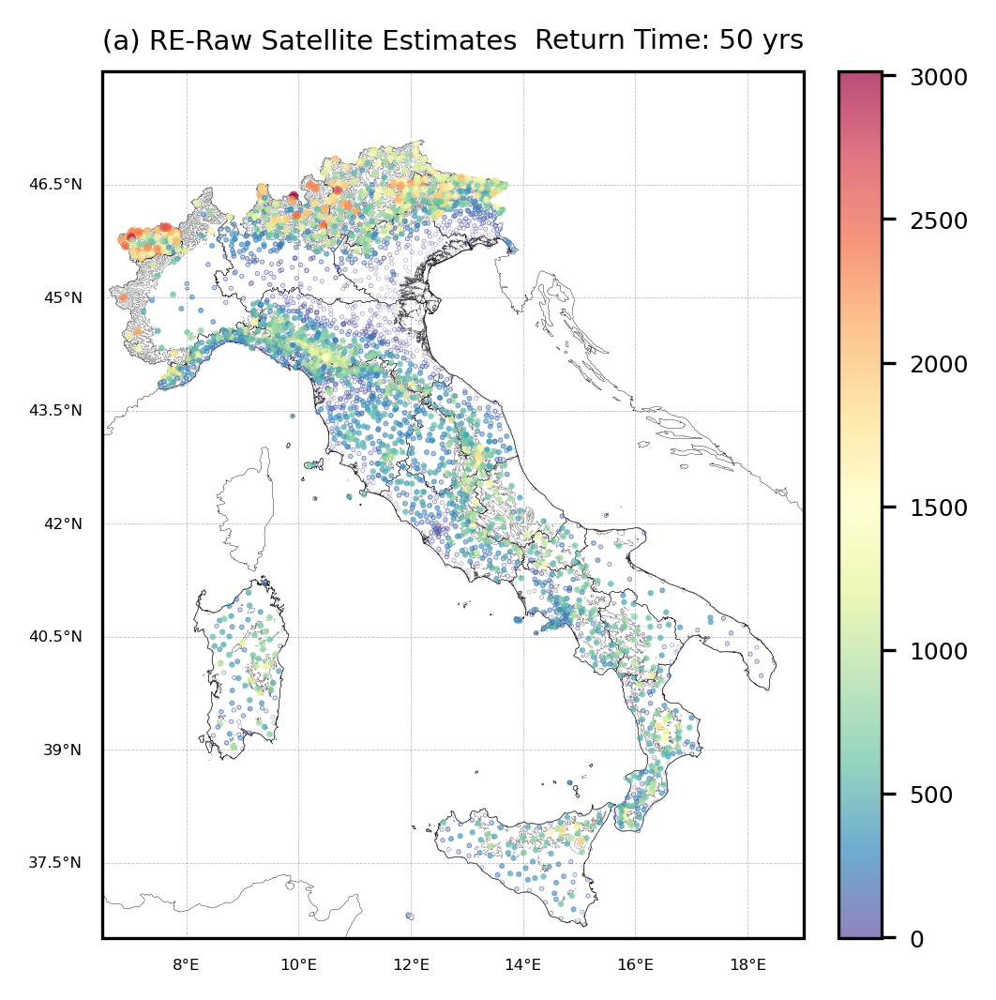

In [35]:
elev_cmap = plt.cm.Spectral_r
proj = ccrs.PlateCarree()

fig = plt.figure(figsize=(4,4),dpi=300)
gs = gridspec.GridSpec(1,1)

# ============================================================================================================================
ax1 = plt.subplot(gs[0, 0], projection = proj)
ax1.set_extent([lon_min, lon_max, lat_min, lat_max], crs=proj)
ax1.add_feature(cf.COASTLINE,linewidth=0.1,color='k')
REGIONS.plot(facecolor='None', ax=ax1, linewidth=0.1, zorder=10)
DEM.plot(facecolor='None', edgecolor='k', ax=ax1, linewidth=0.1, zorder=2, alpha=0.5)

a1 = ax1.scatter(LON_ref, LAT_ref, c=ELEV_ref, cmap=elev_cmap, s=ELEV_ref_norm*2, alpha=0.7, norm=None, zorder=20)

gl = ax1.gridlines(crs=proj,draw_labels=True,linewidth=0.2,color='gray',alpha=0.5,linestyle='--')
gl.top_labels = False
gl.bottom_labels = True
gl.right_labels = False
gl.left_labels = True

gl.xlabel_style = {'size': 4, 'color': 'k'}
gl.ylabel_style = {'size': 4, 'color': 'k'}

cbar = plt.colorbar(a1, ax=ax1, fraction=0.056, pad=0.04)
cbar.ax.tick_params(labelsize=6) 

ax1.set_title('(a) RE-Raw Satellite Estimates', fontsize=7, loc='left')
ax1.set_title('Return Time: 50 yrs', fontsize=7, loc='right')

## Relative Errors distribution

In [36]:
SAT_subes = SAT_RE_flat[SAT_RE_flat<0]
SAT_super = SAT_RE_flat[SAT_RE_flat>0]
print(f'Total of values         : {len(SAT_RE_flat[~np.isnan(SAT_RE_flat)])}')
print(f'# Subestimation values  : {len(SAT_RE_flat[SAT_RE_flat<0])/len(SAT_RE_flat[~np.isnan(SAT_RE_flat)])*100}')
print(f'# Underestimation values: {len(SAT_RE_flat[SAT_RE_flat>0])/len(SAT_RE_flat[~np.isnan(SAT_RE_flat)])*100}')

Total of values         : 2788
# Subestimation values  : 86.97991391678622
# Underestimation values: 13.020086083213773


In [37]:
DOWN_subes = DOWN_RE_flat[DOWN_RE_flat<0]
DOWN_super = DOWN_RE_flat[DOWN_RE_flat>0]
print(f'Total of values       : {len(DOWN_RE_flat[~np.isnan(DOWN_RE_flat)])}')
print(f'# Subestimation values: {len(DOWN_RE_flat[DOWN_RE_flat<0])/len(DOWN_RE_flat[~np.isnan(DOWN_RE_flat)])*100}')
print(f'# Underestimation values: {len(DOWN_RE_flat[DOWN_RE_flat>0])/len(DOWN_RE_flat[~np.isnan(DOWN_RE_flat)])*100}')

Total of values       : 2788
# Subestimation values: 80.55954088952653
# Underestimation values: 19.44045911047346


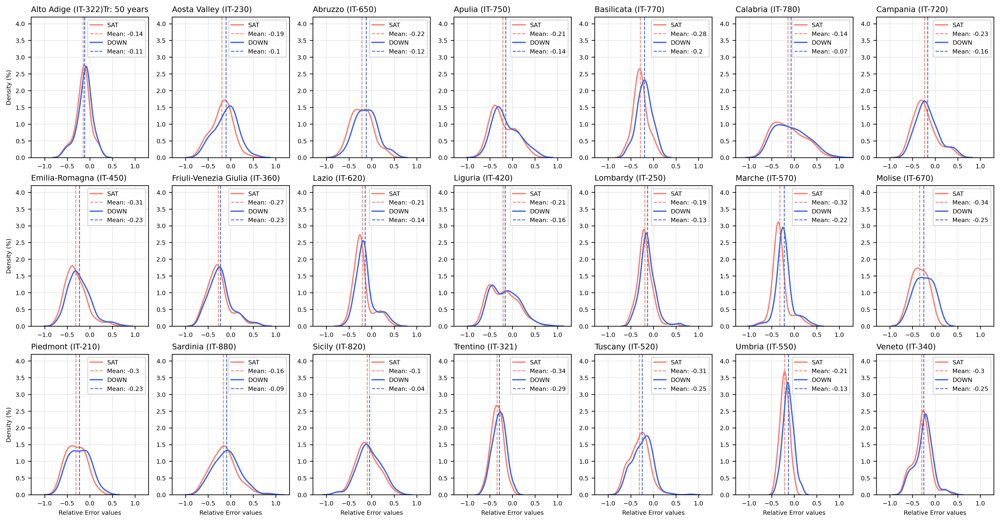

In [38]:
dict_keys = ISO_names['ISO'].values

fig = plt.figure(figsize=(20,10),dpi=300)
gs = gridspec.GridSpec(3,7)

pos = 0
for nrow in range(3):
    for ncol in range(7):
        ax1 = plt.subplot(gs[nrow, ncol])

        SAT_RE_mean = np.round(np.nanmean(SAT_RE[dict_keys[pos]]),2)
        sns.kdeplot(SAT_RE[dict_keys[pos]],color='salmon',cumulative=False,fill=False,multiple="stack",ax=ax1,label=f'SAT')
        ax1.axvline(np.nanmean(SAT_RE[dict_keys[pos]]),color='salmon',linestyle='--',linewidth=1, label=f'Mean: {SAT_RE_mean}')

        DOWN_RE_mean = np.round(np.nanmean(DOWN_RE[dict_keys[pos]]),2)
        sns.kdeplot(DOWN_RE[dict_keys[pos]],color='royalblue',cumulative=False,fill=False,multiple="stack",ax=ax1,label=f'DOWN')
        ax1.axvline(np.nanmean(DOWN_RE[dict_keys[pos]]),color='royalblue',linestyle='--',linewidth=1, label=f'Mean: {DOWN_RE_mean}')

        ax1.set_xlim(-1.3,1.3)
        ax1.set_ylim(0,4.2)
        ax1.legend(fontsize=7, loc=1, ncol=1)
        ax1.grid(linewidth=0.3, linestyle='--')
        ax1.tick_params(axis='both', which='major', labelsize=7)

        if ncol == 0:
            ax1.set_ylabel('')
            ax1.set_ylabel('Density (%)',fontsize=7)
            if nrow == 0:
                ax1.set_title(f'Tr: 50 years', fontsize=9, loc='right')
        else:
            ax1.set_ylabel('')

        if nrow == 2:
            ax1.set_xlabel('Relative Error values',fontsize=7) 
        else:
            ax1.set_xlabel('')

        region_l = ISO_names[ISO_names['ISO']==dict_keys[pos]].values[0][0]
        ISO_l = ISO_names[ISO_names['ISO']==dict_keys[pos]].values[0][1]
        ax1.set_title(f'{region_l} ({ISO_l})', fontsize=9, loc='left')

        pos += 1

## Boxplot

Text(1.0, 1.0, 'Return Time: 50 yrs')

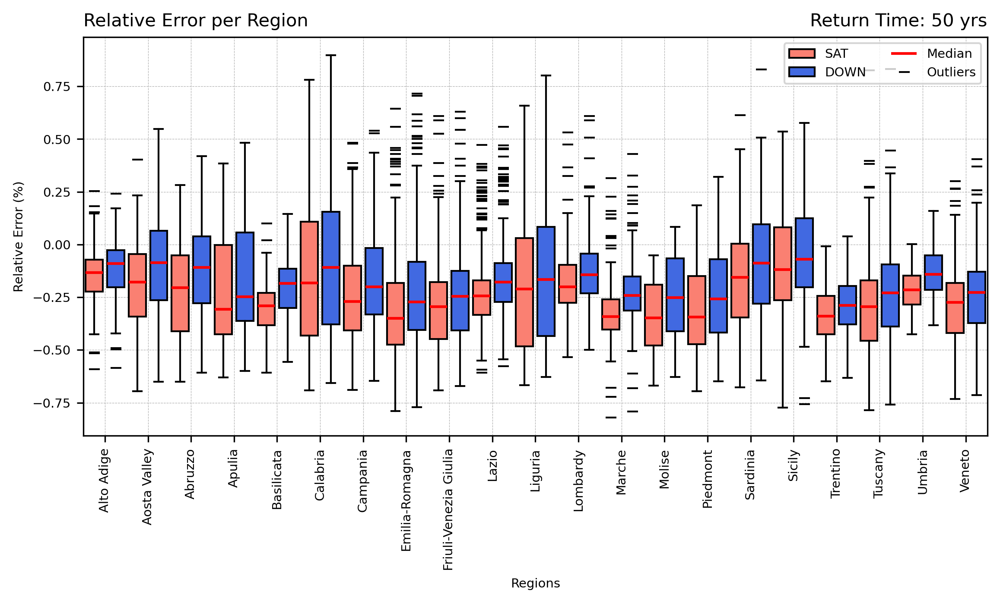

In [39]:
box_width = 0.8
x_pos = np.arange(0.5,42,2)

fig = plt.figure(figsize=(9,4),dpi=300)
gs = gridspec.GridSpec(1,1)

# ============================================================================================================================
ax1 = plt.subplot(gs[0, 0])

SAT_boxprops = dict(facecolor='salmon')
DOWN_boxprops = dict(facecolor='royalblue')

meanprops=dict(linestyle='-',color="g",linewidth=1.5)
flierprops = dict(marker='_',markeredgecolor='k',linewidth=1.5)
medianprops = dict(linestyle='-', linewidth=1.5, color='r')

SAT_boxes = []
DOWN_boxes = []
medians = []
fliers = []
for pos in range(len(dict_keys)):

    SAT_tmp = SAT_RE[dict_keys[pos]]
    SAT_tmp = SAT_tmp[~np.isnan(SAT_tmp)]
    SAT_box = ax1.boxplot(SAT_tmp,positions=[2*pos],
    widths=box_width,boxprops=SAT_boxprops,
    showmeans=False,meanline=True,meanprops=meanprops,
    medianprops=medianprops,
    showfliers=True,flierprops=flierprops,
    patch_artist=True,notch=False)

    DOWN_tmp = DOWN_RE[dict_keys[pos]]
    DOWN_tmp = DOWN_tmp[~np.isnan(DOWN_tmp)]
    DOWN_box = ax1.boxplot(DOWN_tmp,positions=[2*pos+1],
    widths=box_width,boxprops=DOWN_boxprops,
    showmeans=False,meanline=True,meanprops=meanprops,
    medianprops=medianprops,
    showfliers=True,flierprops=flierprops,
    patch_artist=True,notch=False)

    SAT_boxes.append(SAT_box["boxes"][0])
    DOWN_boxes.append(DOWN_box["boxes"][0])
    medians.append(SAT_box["medians"][0])
    fliers.append(SAT_box["fliers"][0])

ax1.plot([],[],linestyle='-',c='r',label='Median')
ax1.plot([],[],linestyle='-',c='k',label='Outliers')

ax1.tick_params(axis='both', which='major', labelsize=7)
ax1.set_xticks(x_pos)
ax1.set_xticklabels(ISO_names['Region'].values, rotation='vertical')

ax1.grid(linewidth=0.3, linestyle='--')

ax1.legend([SAT_boxes[0], DOWN_boxes[0], medians[0], fliers[0]],
        ['SAT', 'DOWN', 'Median', 'Outliers'], 
        ncol=2,fontsize=7,loc=1)

ax1.set_ylabel('Relative Error (%)', fontsize=7)
ax1.set_xlabel('Regions', fontsize=7)

ax1.set_title('Relative Error per Region', fontsize=10, loc='left')
ax1.set_title('Return Time: 50 yrs', fontsize=10, loc='right')

Export figure to: ../figures/Article_down/figure6.png


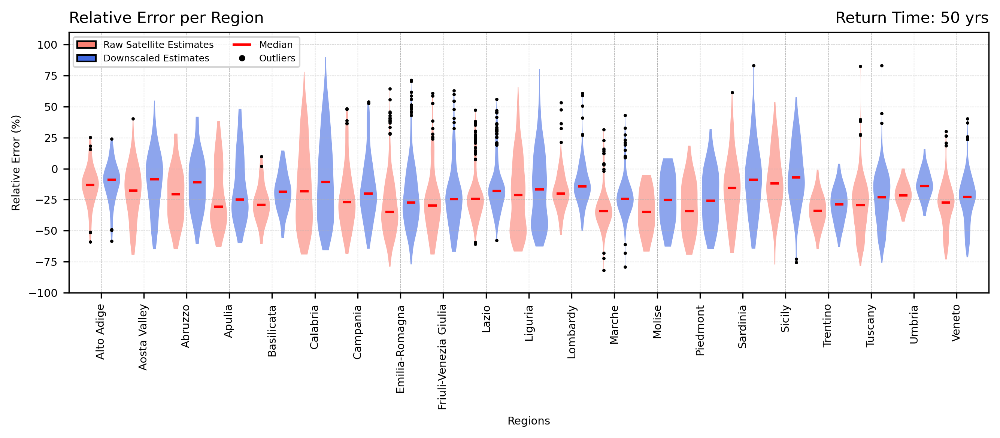

In [40]:
box_width = 0.8
x_pos = np.arange(0.5, 42, 2)

fig = plt.figure(figsize=(9,4), dpi=300)
gs = gridspec.GridSpec(1,1)

ax1 = plt.subplot(gs[0, 0])

# Colores personalizados
SAT_color = "salmon"
DOWN_color = "royalblue"

SAT_bodies = []
DOWN_bodies = []

for pos in range(len(dict_keys)):
    # ====================================================================================
    # SAT
    SAT_tmp = SAT_RE[dict_keys[pos]]
    SAT_tmp = SAT_tmp[~np.isnan(SAT_tmp)]*100

    SAT_vio = ax1.violinplot(SAT_tmp, positions=[2*pos], widths=box_width,
                            showmeans=False, showextrema=False, showmedians=True)
    for b in SAT_vio['bodies']:
        b.set_facecolor(SAT_color)
        b.set_alpha(0.6)
    SAT_vio['cmedians'].set_color("r")
    SAT_bodies.append(SAT_vio['bodies'][0])
    
    Q1 = np.percentile(SAT_tmp, 25)
    Q3 = np.percentile(SAT_tmp, 75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers_SAT = SAT_tmp[(SAT_tmp < lower_bound) | (SAT_tmp > upper_bound)]
    ax1.scatter(np.repeat(2*pos, len(outliers_SAT)), outliers_SAT,
                color="k", marker=".", s=5, zorder=20, label="Outliers" if pos==0 else "")

    # ====================================================================================
    # DOWN
    DOWN_tmp = DOWN_RE[dict_keys[pos]]
    DOWN_tmp = DOWN_tmp[~np.isnan(DOWN_tmp)]*100

    DOWN_vio = ax1.violinplot(DOWN_tmp, positions=[2*pos+1], widths=box_width,
                            showmeans=False, showextrema=False, showmedians=True)
    for b in DOWN_vio['bodies']:
        b.set_facecolor(DOWN_color)
        b.set_alpha(0.6)
    DOWN_vio['cmedians'].set_color("r")
    DOWN_bodies.append(DOWN_vio['bodies'][0])
    
    Q1 = np.percentile(DOWN_tmp, 25)
    Q3 = np.percentile(DOWN_tmp, 75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers_DOWN = DOWN_tmp[(DOWN_tmp < lower_bound) | (DOWN_tmp > upper_bound)]
    ax1.scatter(np.repeat(2*pos+1, len(outliers_DOWN)), outliers_DOWN,
                color="k", marker=".", s=5, zorder=20, label="Outliers" if pos==0 else "")

out = ax1.plot([],[],'.',c='k',label='Outliers')[0]

# Ejes y leyenda
ax1.tick_params(axis='both', which='major', labelsize=7)
ax1.set_xticks(x_pos)
ax1.set_xticklabels(ISO_names['Region'].values, rotation='vertical')
ax1.set_xlim(-1,42)
ax1.set_ylim(-100,110)

ax1.grid(linewidth=0.3, linestyle='--')

ax1.legend(
    [SAT_boxes[0], DOWN_boxes[0], medians[0], out],
    ['Raw Satellite Estimates', 'Downscaled Estimates', 'Median', 'Outliers'], 
    ncol=2, fontsize=6, loc=2
)

ax1.set_ylabel('Relative Error (%)', fontsize=7)
ax1.set_xlabel('Regions', fontsize=7)

ax1.set_title('Relative Error per Region', fontsize=10, loc='left')
ax1.set_title('Return Time: 50 yrs', fontsize=10, loc='right')

plt.tight_layout()

salida = os.path.join('..','figures','Article_down','figure6.png')
print(f'Export figure to: {salida}')
# plt.savefig(salida,transparent = False,bbox_inches ='tight',pad_inches = 0.1, facecolor=None)


## Mean Relative Error

In [41]:
SAT_mean = []
SAT_median = []
DOWN_mean = []
DOWN_median = []
for pos in range(len(ISO_names)):
    SAT_mean.append(float(np.nanmean(SAT_RE[ISO_names['ISO'].values[pos]])))
    SAT_median.append(float(np.nanmedian(SAT_RE[ISO_names['ISO'].values[pos]])))
    DOWN_mean.append(float(np.nanmean(DOWN_RE[ISO_names['ISO'].values[pos]])))
    DOWN_median.append(float(np.nanmedian(DOWN_RE[ISO_names['ISO'].values[pos]])))

ISO_names['SAT_RE_mean'] = SAT_mean
ISO_names['DOWN_RE_mean'] = DOWN_mean
ISO_names['SAT_RE_median'] = SAT_median
ISO_names['DOWN_RE_median'] = DOWN_median

Export figure to: ../figures/Article_down/mean_median.png


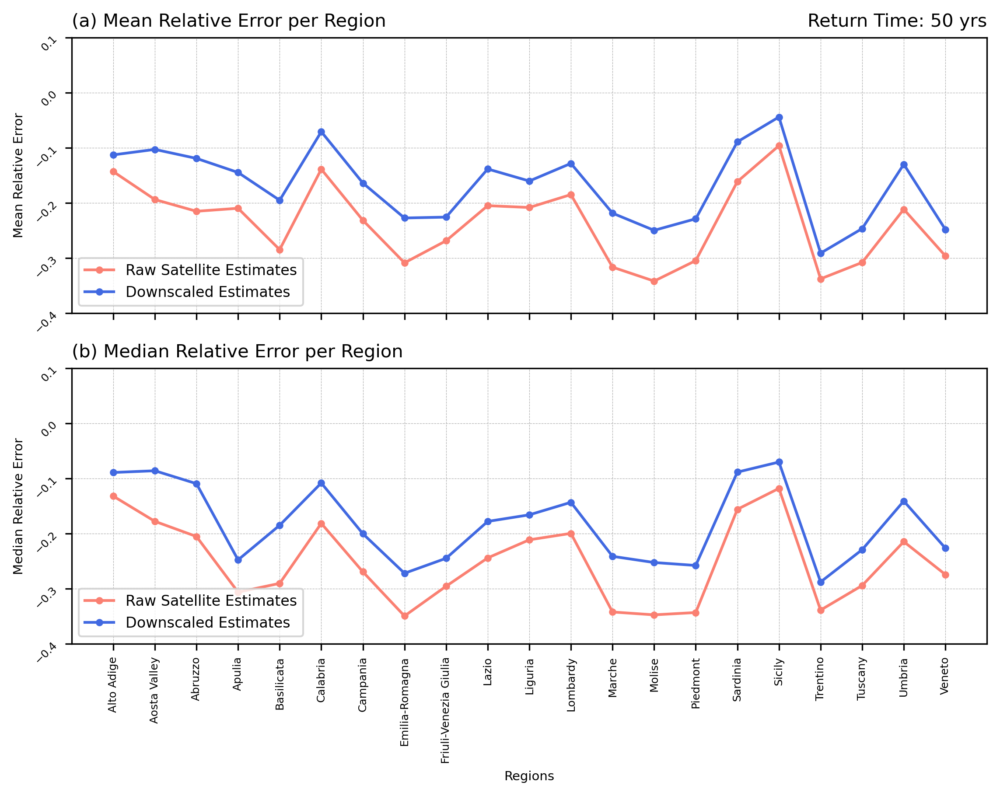

In [42]:
fig = plt.figure(figsize=(9,6),dpi=300)
gs = gridspec.GridSpec(2,1)

# ============================================================================================================================
ax1 = plt.subplot(gs[0, 0])
ax1.plot(ISO_names['SAT_RE_mean'].index, ISO_names['SAT_RE_mean'].values, '.-', c='salmon', label='Raw Satellite Estimates')
ax1.plot(ISO_names['DOWN_RE_mean'].index, ISO_names['DOWN_RE_mean'].values, '.-', c='royalblue', label='Downscaled Estimates')

ax1.set_ylabel('Mean Relative Error', fontsize=7)

ax1.set_xticks(ISO_names['SAT_RE_mean'].index)
ax1.set_xticklabels([])

ax1.grid(linewidth=0.3, linestyle='--')
ax1.legend(ncol=1,fontsize=8,loc=3)
ax1.tick_params(axis='both', which='major', labelsize=6, labelrotation=90)

ax1.set_title('(a) Mean Relative Error per Region', fontsize=10, loc='left')
ax1.set_title('Return Time: 50 yrs', fontsize=10, loc='right')

ax1.tick_params(axis='y', which='major', labelsize=6, rotation=45) 

ax1.set_ylim(-0.4,0.1)

# ============================================================================================================================
ax1 = plt.subplot(gs[1, 0])
ax1.plot(ISO_names['SAT_RE_median'].index, ISO_names['SAT_RE_median'].values, '.-', c='salmon', label='Raw Satellite Estimates')
ax1.plot(ISO_names['DOWN_RE_median'].index, ISO_names['DOWN_RE_median'].values, '.-', c='royalblue', label='Downscaled Estimates')

ax1.set_ylabel('Median Relative Error', fontsize=7)
ax1.set_xlabel('Regions', fontsize=7)

ax1.set_xticks(ISO_names['SAT_RE_median'].index)
ax1.set_xticklabels(ISO_names['Region'])

ax1.grid(linewidth=0.3, linestyle='--')
ax1.legend(ncol=1,fontsize=8,loc=3)
ax1.tick_params(axis='both', which='major', labelsize=6, labelrotation=90)

ax1.set_title('(b) Median Relative Error per Region', fontsize=10, loc='left')

ax1.tick_params(axis='y', which='major', labelsize=6, rotation=45) 

ax1.set_ylim(-0.4,0.1)

# ============================================================================================================================
salida = os.path.join('..','figures','Article_down','mean_median.png')
print(f'Export figure to: {salida}')
# plt.savefig(salida,transparent = False,bbox_inches ='tight',pad_inches = 0.1, facecolor=None)

## Add Geometry in ISO_names

In [43]:
REGIONS_merged = REGIONS.merge(ISO_names, on="Region")

## Spatial Mean Relative Error

In [44]:
cmap="Reds_r"
CBAR_vals = plt.cm.ScalarMappable(
    cmap=cmap,
    norm=plt.Normalize(
        vmin=np.nanmin([np.nanmin(ISO_names["SAT_RE_mean"]),np.nanmin(ISO_names["DOWN_RE_mean"])]),
        vmax=np.nanmax([np.nanmax(ISO_names["SAT_RE_mean"]),np.nanmax(ISO_names["DOWN_RE_mean"])])))

/home/arturo/anaconda3/envs/AXE/lib/python3.13/site-packages/cartopy/mpl/feature_artist.py:144: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
/home/arturo/anaconda3/envs/AXE/lib/python3.13/site-packages/cartopy/mpl/feature_artist.py:144: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


Export figure to: ../figures/Article_down/figure7.png


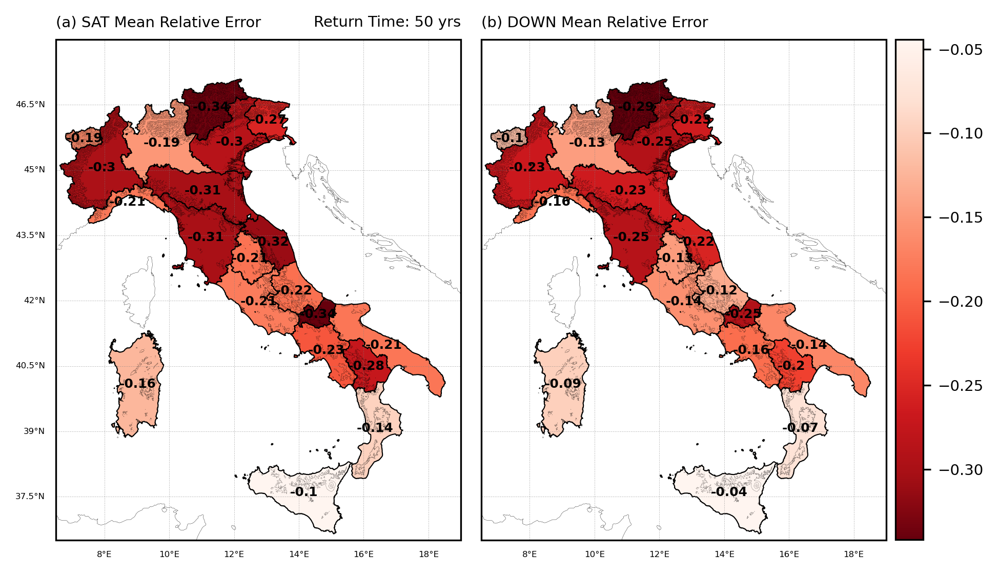

In [45]:
proj = ccrs.PlateCarree()

fig = plt.figure(figsize=(6,4),dpi=300)
gs = gridspec.GridSpec(1,2)

# ============================================================================================================================
ax1 = plt.subplot(gs[0, 0], projection = proj)
ax1.set_extent([lon_min, lon_max, lat_min, lat_max], crs=proj)
ax1.add_feature(cf.COASTLINE,linewidth=0.1,color='k')

im = REGIONS_merged.plot(column="SAT_RE_mean", cmap=cmap, legend=False, edgecolor="black", linewidth=0.5, ax=ax1)
DEM.plot(facecolor='None', edgecolor='k', ax=ax1, linewidth=0.1, zorder=21, alpha=0.5)

for idx, row in REGIONS.iterrows():
    lon_c, lat_c = row['geometry'].centroid.xy
    lon_c = lon_c[0]
    lat_c = lat_c[0]

    val_mean_tmp = np.round(REGIONS_merged[REGIONS_merged['Region']==row['Region']]['SAT_RE_mean'].values[0],2)
    ax1.text(
        lon_c, lat_c, val_mean_tmp, 
        fontsize=6, color="k", 
        ha='center', va='center', fontweight='bold', zorder=50
    )

gl = ax1.gridlines(crs=proj,draw_labels=True,linewidth=0.2,color='gray',alpha=0.5,linestyle='--')
gl.top_labels = False
gl.bottom_labels = True
gl.right_labels = False
gl.left_labels =True

gl.xlabel_style = {'size': 4, 'color': 'k'}
gl.ylabel_style = {'size': 4, 'color': 'k'}

# CBAR = plt.colorbar(
#     CBAR_vals,
#     ax=ax1,
#     ticks=np.round(ticks_level, 2),
#     fraction=0.056,
#     pad=0.03,
#     orientation="vertical")
# CBAR.ax.tick_params(labelsize=7) 

ax1.set_title('(a) SAT Mean Relative Error', fontsize=7, loc='left')
ax1.set_title('Return Time: 50 yrs', fontsize=7, loc='right')

# ============================================================================================================================
ax1 = plt.subplot(gs[0, 1], projection = proj)
ax1.set_extent([lon_min, lon_max, lat_min, lat_max], crs=proj)
ax1.add_feature(cf.COASTLINE,linewidth=0.1,color='k')

im = REGIONS_merged.plot(column="DOWN_RE_mean", cmap=cmap,legend=False, edgecolor="black", linewidth=0.5, ax=ax1)
DEM.plot(facecolor='None', edgecolor='k', ax=ax1, linewidth=0.1, zorder=21, alpha=0.5)

for idx, row in REGIONS.iterrows():
    lon_c, lat_c = row['geometry'].centroid.xy
    lon_c = lon_c[0]
    lat_c = lat_c[0]

    val_mean_tmp = np.round(REGIONS_merged[REGIONS_merged['Region']==row['Region']]['DOWN_RE_mean'].values[0],2)
    ax1.text(
        lon_c, lat_c, val_mean_tmp, 
        fontsize=6, color="k", 
        ha='center', va='center', fontweight='bold', zorder=50
    )

gl = ax1.gridlines(crs=proj,draw_labels=True,linewidth=0.2,color='gray',alpha=0.5,linestyle='--')
gl.top_labels = False
gl.bottom_labels = True
gl.right_labels = False
gl.left_labels =False

gl.xlabel_style = {'size': 4, 'color': 'k'}
gl.ylabel_style = {'size': 4, 'color': 'k'}

# CBAR = plt.colorbar(
#     CBAR_vals,
#     ax=ax1,
#     ticks=np.round(ticks_level, 2),
#     fraction=0.056,
#     pad=0.03,
#     orientation="vertical")
# CBAR.ax.tick_params(labelsize=7) 

ax1.set_title('(b) DOWN Mean Relative Error', fontsize=7, loc='left')

# ============================================================================================================================
plt.subplots_adjust(left=0.05, bottom=0.05, right=0.95, top=0.95, wspace=0.05, hspace=0.1)

cbar_ax = fig.add_axes([0.96, 0.094, 0.03, 0.813])#0.96
cbar = fig.colorbar(CBAR_vals, cax=cbar_ax, orientation='vertical')
cbar.ax.tick_params(labelsize=7)

# ============================================================================================================================
salida = os.path.join('..','figures','Article_down','figure7.png')
print(f'Export figure to: {salida}')
# plt.savefig(salida,transparent = False,bbox_inches ='tight',pad_inches = 0.1, facecolor=None)

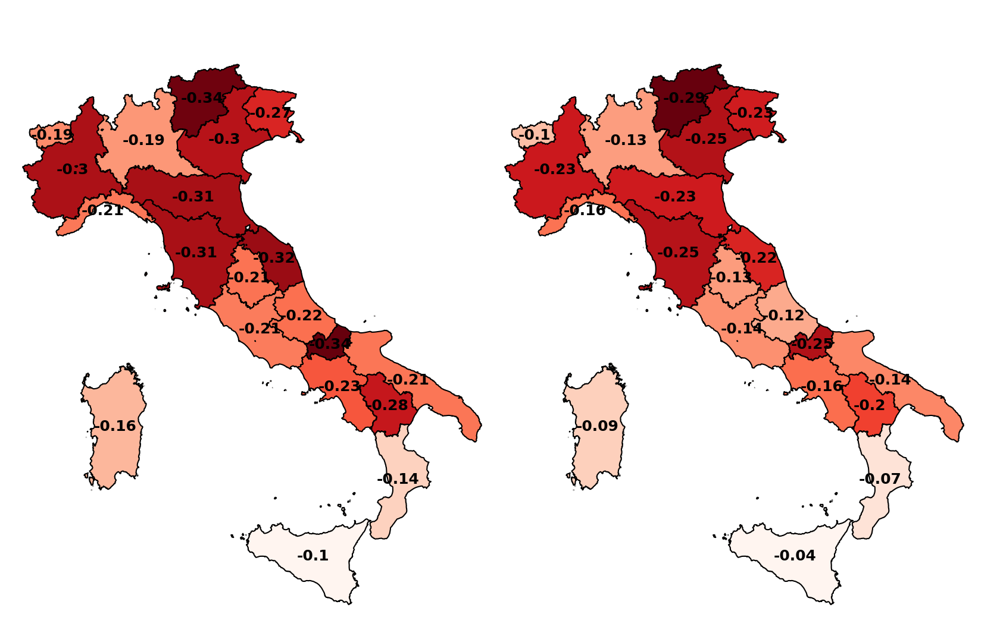

In [46]:
proj = ccrs.PlateCarree()

fig = plt.figure(figsize=(6,4),dpi=300)
gs = gridspec.GridSpec(1,2)

# ============================================================================================================================
ax1 = plt.subplot(gs[0, 0], projection = proj)
ax1.set_extent([lon_min, lon_max, lat_min, lat_max], crs=proj)

im = REGIONS_merged.plot(column="SAT_RE_mean", cmap=cmap, legend=False, edgecolor="black", linewidth=0.5, ax=ax1)

for idx, row in REGIONS.iterrows():
    lon_c, lat_c = row['geometry'].centroid.xy
    lon_c = lon_c[0]
    lat_c = lat_c[0]

    val_mean_tmp = np.round(REGIONS_merged[REGIONS_merged['Region']==row['Region']]['SAT_RE_mean'].values[0],2)
    ax1.text(
        lon_c, lat_c, val_mean_tmp, 
        fontsize=6, color="k", 
        ha='center', va='center', fontweight='bold', zorder=50
    )

ax1.axis('off')

# ============================================================================================================================
ax1 = plt.subplot(gs[0, 1], projection = proj)
ax1.set_extent([lon_min, lon_max, lat_min, lat_max], crs=proj)

im = REGIONS_merged.plot(column="DOWN_RE_mean", cmap=cmap,legend=False, edgecolor="black", linewidth=0.5, ax=ax1)

for idx, row in REGIONS.iterrows():
    lon_c, lat_c = row['geometry'].centroid.xy
    lon_c = lon_c[0]
    lat_c = lat_c[0]

    val_mean_tmp = np.round(REGIONS_merged[REGIONS_merged['Region']==row['Region']]['DOWN_RE_mean'].values[0],2)
    ax1.text(
        lon_c, lat_c, val_mean_tmp, 
        fontsize=6, color="k", 
        ha='center', va='center', fontweight='bold', zorder=50
    )

ax1.axis('off')

# ============================================================================================================================
plt.subplots_adjust(left=0.05, bottom=0.05, right=0.95, top=0.95, wspace=0.0, hspace=-0.1)

fig.patch.set_alpha(0)

# salida = '../figures/QERROR/SAT_DOWN_RE.png'
# print(salida)
# plt.savefig(salida,transparent = False,bbox_inches ='tight',pad_inches = 0.1, facecolor=None)

## Spatial Scatter plot

In [47]:
# RE_DOWN_ALL, RE_DOWN_ALL_NORM, LAT_DOWN_ALL, LON_DOWN_ALL = [], [], [], []
# RE_SAT_ALL, RE_SAT_ALL_NORM, LAT_SAT_ALL, LON_SAT_ALL = [], [], [], []
# for pos in range(len(dict_keys)):
#     RE_DOWN_tmp = DOWN_RE[dict_keys[pos]].values
#     RE_SAT_tmp = SAT_RE[dict_keys[pos]].values


#     RE_DOWN_lat = DOWN_RE_LAT[dict_keys[pos]].values
#     RE_DOWN_lon = DOWN_RE_LON[dict_keys[pos]].values

#     RE_SAT_lat = SAT_RE_LAT[dict_keys[pos]].values
#     RE_SAT_lon = SAT_RE_LON[dict_keys[pos]].values

#     RE_DOWN_lat = RE_DOWN_lat[~np.isnan(RE_SAT_tmp)]
#     RE_DOWN_lon = RE_DOWN_lon[~np.isnan(RE_SAT_tmp)]
#     RE_DOWN_tmp = RE_DOWN_tmp[~np.isnan(RE_SAT_tmp)]

#     RE_SAT_lat = RE_SAT_lat[~np.isnan(RE_SAT_tmp)]
#     RE_SAT_lon = RE_SAT_lon[~np.isnan(RE_SAT_tmp)]
#     RE_SAT_tmp = RE_SAT_tmp[~np.isnan(RE_SAT_tmp)]

#     val_DOWN = abs(RE_DOWN_tmp)
#     val_SAT = abs(RE_SAT_tmp)

#     val_DOWN_norm = (val_DOWN - np.min(val_DOWN))/(np.nanmax(val_DOWN) - np.min(val_DOWN))
#     val_SAT_norm = (val_SAT - np.min(val_SAT))/(np.nanmax(val_SAT) - np.min(val_SAT))
    
#     RE_DOWN_ALL.extend(RE_DOWN_tmp)
#     RE_DOWN_ALL_NORM.extend(val_DOWN_norm)
#     LAT_DOWN_ALL.extend(RE_DOWN_lat)
#     LON_DOWN_ALL.extend(RE_DOWN_lon)
    
#     RE_SAT_ALL.extend(RE_SAT_tmp)
#     RE_SAT_ALL_NORM.extend(val_SAT_norm)
#     LAT_SAT_ALL.extend(RE_SAT_lat)
#     LON_SAT_ALL.extend(RE_SAT_lon)

RE_DOWN_ALL, RE_DOWN_ALL_NORM, LAT_DOWN_ALL, LON_DOWN_ALL = [], [], [], []
for pos in range(len(dict_keys)):
    RE_DOWN_tmp = DOWN_RE[dict_keys[pos]].values
    RE_DOWN_lat = OBS_RE_LAT[dict_keys[pos]].values
    RE_DOWN_lon = OBS_RE_LON[dict_keys[pos]].values

    RE_DOWN_lat = RE_DOWN_lat[~np.isnan(RE_DOWN_tmp)]
    RE_DOWN_lon = RE_DOWN_lon[~np.isnan(RE_DOWN_tmp)]
    RE_DOWN_tmp = RE_DOWN_tmp[~np.isnan(RE_DOWN_tmp)]

    val_DOWN = abs(RE_DOWN_tmp)
    val_DOWN_norm = (val_DOWN - np.min(val_DOWN))/(np.nanmax(val_DOWN) - np.min(val_DOWN))
    
    RE_DOWN_ALL.extend(RE_DOWN_tmp)
    RE_DOWN_ALL_NORM.extend(val_DOWN_norm)
    LAT_DOWN_ALL.extend(RE_DOWN_lat)
    LON_DOWN_ALL.extend(RE_DOWN_lon)

RE_SAT_ALL, RE_SAT_ALL_NORM, LAT_SAT_ALL, LON_SAT_ALL = [], [], [], []
for pos in range(len(dict_keys)):
    RE_SAT_tmp = SAT_RE[dict_keys[pos]].values
    RE_SAT_lat = OBS_RE_LAT[dict_keys[pos]].values
    RE_SAT_lon = OBS_RE_LON[dict_keys[pos]].values

    RE_SAT_lat = RE_SAT_lat[~np.isnan(RE_SAT_tmp)]
    RE_SAT_lon = RE_SAT_lon[~np.isnan(RE_SAT_tmp)]
    RE_SAT_tmp = RE_SAT_tmp[~np.isnan(RE_SAT_tmp)]

    val_SAT = abs(RE_SAT_tmp)
    val_SAT_norm = (val_SAT - np.min(val_SAT))/(np.nanmax(val_SAT) - np.min(val_SAT))
    
    RE_SAT_ALL.extend(RE_SAT_tmp)
    RE_SAT_ALL_NORM.extend(val_SAT_norm)
    LAT_SAT_ALL.extend(RE_SAT_lat)
    LON_SAT_ALL.extend(RE_SAT_lon)

In [48]:
levels = np.arange(-0.9,1.1,0.1)
# ticks = np.arange(-1.6,2.0,0.4)

norm = mcolors.BoundaryNorm(boundaries=levels, ncolors=256)

In [49]:
np.min(RE_SAT_ALL), np.max(RE_SAT_ALL), np.min(RE_DOWN_ALL), np.max(RE_DOWN_ALL)

(np.float64(-0.8201925539768029),
 np.float64(0.8256234588871352),
 np.float64(-0.7923288239031476),
 np.float64(0.8978149466158049))

/home/arturo/anaconda3/envs/AXE/lib/python3.13/site-packages/cartopy/mpl/feature_artist.py:144: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
/home/arturo/anaconda3/envs/AXE/lib/python3.13/site-packages/cartopy/mpl/feature_artist.py:144: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


Export figure to: ../figures/Article_down/figure8.png


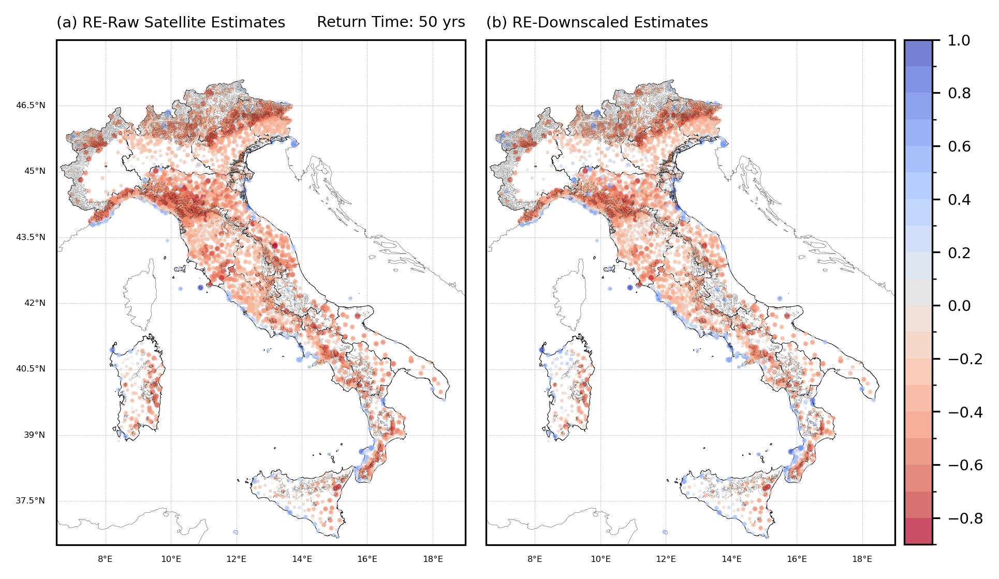

In [50]:
proj = ccrs.PlateCarree()

fig = plt.figure(figsize=(6,4),dpi=300)
gs = gridspec.GridSpec(1,2)

# ============================================================================================================================
ax1 = plt.subplot(gs[0, 0], projection = proj)
ax1.set_extent([lon_min, lon_max, lat_min, lat_max], crs=proj)
ax1.add_feature(cf.COASTLINE,linewidth=0.1,color='k')

im = REGIONS_merged.plot(legend=False, color='white', edgecolor="black", linewidth=0.2, ax=ax1)
DEM.plot(facecolor='None', edgecolor='k', ax=ax1, linewidth=0.1, zorder=21, alpha=0.5)

a1 = ax1.scatter(LON_SAT_ALL, LAT_SAT_ALL, c=RE_SAT_ALL, cmap='coolwarm_r', s=np.array(RE_SAT_ALL_NORM)*3, alpha=0.7, norm=norm, zorder=20)

gl = ax1.gridlines(crs=proj,draw_labels=True,linewidth=0.2,color='gray',alpha=0.5,linestyle='--')
gl.top_labels = False
gl.bottom_labels = True
gl.right_labels = False
gl.left_labels = True

gl.xlabel_style = {'size': 4, 'color': 'k'}
gl.ylabel_style = {'size': 4, 'color': 'k'}

# cbar = plt.colorbar(a1, ax=ax1, fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6) 

ax1.set_title('(a) RE-Raw Satellite Estimates', fontsize=7, loc='left')
ax1.set_title('Return Time: 50 yrs', fontsize=7, loc='right')

# ============================================================================================================================
ax1 = plt.subplot(gs[0, 1], projection = proj)
ax1.set_extent([lon_min, lon_max, lat_min, lat_max], crs=proj)
ax1.add_feature(cf.COASTLINE,linewidth=0.1,color='k')

im = REGIONS_merged.plot(legend=False, color='white', edgecolor="black", linewidth=0.2, ax=ax1)
DEM.plot(facecolor='None', edgecolor='k', ax=ax1, linewidth=0.1, zorder=21, alpha=0.5)

a1 = ax1.scatter(LON_DOWN_ALL, LAT_DOWN_ALL, c=RE_DOWN_ALL, cmap='coolwarm_r', s=np.array(RE_DOWN_ALL_NORM)*3, alpha=0.7, norm=norm, zorder=20)

gl = ax1.gridlines(crs=proj,draw_labels=True,linewidth=0.2,color='gray',alpha=0.5,linestyle='--')
gl.top_labels = False
gl.bottom_labels = True
gl.right_labels = False
gl.left_labels =False

gl.xlabel_style = {'size': 4, 'color': 'k'}
gl.ylabel_style = {'size': 4, 'color': 'k'}

# cbar = plt.colorbar(a1, ax=ax1, fraction=0.056, pad=0.04)
# cbar.ax.tick_params(labelsize=6) 

ax1.set_title('(b) RE-Downscaled Estimates', fontsize=7, loc='left')

# ============================================================================================================================
plt.subplots_adjust(left=0.05, bottom=0.05, right=0.95, top=0.95, wspace=0.05, hspace=0.1)

cbar_ax = fig.add_axes([0.96, 0.094, 0.03, 0.813])#0.96
cbar = fig.colorbar(a1, cax=cbar_ax, orientation='vertical')
cbar.ax.tick_params(labelsize=7)

salida = os.path.join('..','figures','Article_down','figure8.png')
print(f'Export figure to: {salida}')
# plt.savefig(salida,transparent = False,bbox_inches ='tight',pad_inches = 0.1, facecolor=None)

In [51]:
p_min = 2
p_max = 98

RE_DOWN_ALL = np.array(RE_DOWN_ALL)
LON_DOWN_ALL = np.array(LON_DOWN_ALL)
LAT_DOWN_ALL = np.array(LAT_DOWN_ALL)

RE_DOWN_ALL_P5 = RE_DOWN_ALL[RE_DOWN_ALL<np.percentile(RE_DOWN_ALL,p_min)]
LON_DOWN_ALL_P5 = LON_DOWN_ALL[RE_DOWN_ALL<np.percentile(RE_DOWN_ALL,p_min)]
LAT_DOWN_ALL_P5 = LAT_DOWN_ALL[RE_DOWN_ALL<np.percentile(RE_DOWN_ALL,p_min)]

RE_DOWN_ALL_P95 = RE_DOWN_ALL[RE_DOWN_ALL>np.percentile(RE_DOWN_ALL,p_max)]
LON_DOWN_ALL_P95 = LON_DOWN_ALL[RE_DOWN_ALL>np.percentile(RE_DOWN_ALL,p_max)]
LAT_DOWN_ALL_P95 = LAT_DOWN_ALL[RE_DOWN_ALL>np.percentile(RE_DOWN_ALL,p_max)]

RE_DOWN_ALL_P5_norm = (abs(RE_DOWN_ALL_P5) - np.min(abs(RE_DOWN_ALL_P5)))/(np.nanmax(abs(RE_DOWN_ALL_P5)) - np.min(abs(RE_DOWN_ALL_P5)))
RE_DOWN_ALL_P95_norm = (abs(RE_DOWN_ALL_P95) - np.min(abs(RE_DOWN_ALL_P95)))/(np.nanmax(abs(RE_DOWN_ALL_P95)) - np.min(abs(RE_DOWN_ALL_P95)))

In [52]:
levels_P5 = np.arange(-0.8,-0.5,0.05)
norm_P5 = mcolors.BoundaryNorm(boundaries=levels_P5, ncolors=256)

levels_P95 = np.arange(0.3,1.0,0.1)
norm_P95 = mcolors.BoundaryNorm(boundaries=levels_P95, ncolors=256)

/home/arturo/anaconda3/envs/AXE/lib/python3.13/site-packages/cartopy/mpl/feature_artist.py:144: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
/home/arturo/anaconda3/envs/AXE/lib/python3.13/site-packages/cartopy/mpl/feature_artist.py:144: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


Export figure to: ../figures/Article_down/figure9.png


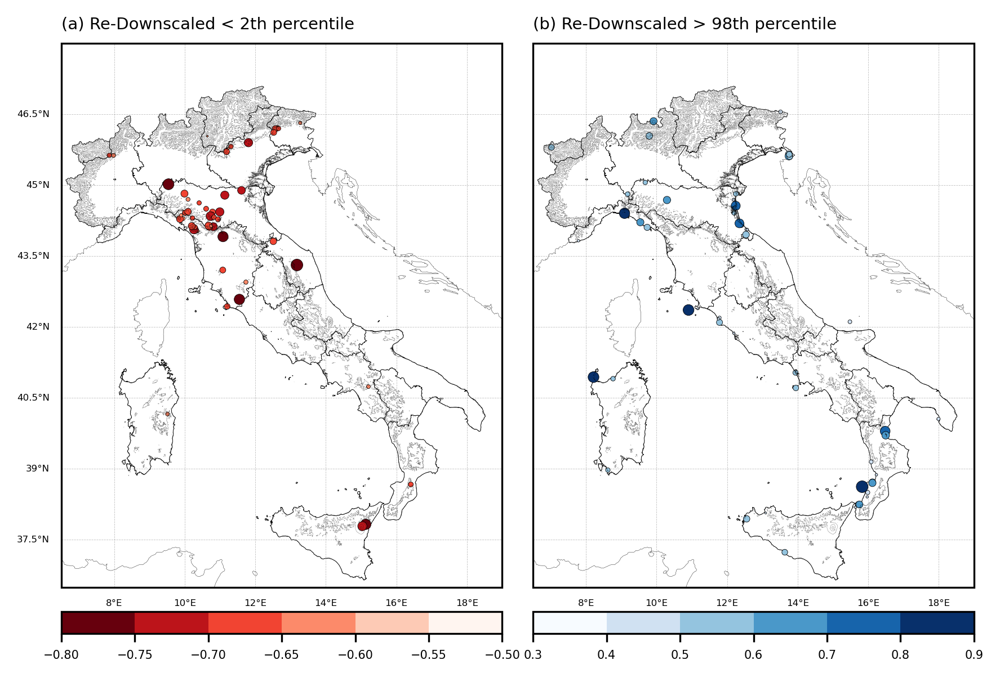

In [53]:
proj = ccrs.PlateCarree()

fig = plt.figure(figsize=(6,4),dpi=300)
gs = gridspec.GridSpec(1,2)

# ============================================================================================================================
ax1 = plt.subplot(gs[0, 0], projection = proj)
ax1.set_extent([lon_min, lon_max, lat_min, lat_max], crs=proj)
ax1.add_feature(cf.COASTLINE,linewidth=0.1,color='k')

im = REGIONS_merged.plot(legend=False, color='white', edgecolor="black", linewidth=0.2, ax=ax1)
DEM.plot(facecolor='None', edgecolor='k', ax=ax1, linewidth=0.1, zorder=21, alpha=0.5)

a1 = ax1.scatter(LON_DOWN_ALL_P5, LAT_DOWN_ALL_P5, c=RE_DOWN_ALL_P5, cmap='Reds_r', s=RE_DOWN_ALL_P5_norm*25, alpha=1, norm=norm_P5, zorder=20, edgecolors='black', linewidths=0.2)

gl = ax1.gridlines(crs=proj,draw_labels=True,linewidth=0.2,color='gray',alpha=0.5,linestyle='--')
gl.top_labels = False
gl.bottom_labels = True
gl.right_labels = False
gl.left_labels = True

gl.xlabel_style = {'size': 4, 'color': 'k'}
gl.ylabel_style = {'size': 4, 'color': 'k'}

cbar = plt.colorbar(a1, ax=ax1, fraction=0.056, pad=0.04, orientation='horizontal')
cbar.ax.tick_params(labelsize=5) 

ax1.set_title(f'(a) Re-Downscaled < {p_min}th percentile', fontsize=7, loc='left')

# ============================================================================================================================
ax1 = plt.subplot(gs[0, 1], projection = proj)
ax1.set_extent([lon_min, lon_max, lat_min, lat_max], crs=proj)
ax1.add_feature(cf.COASTLINE,linewidth=0.1,color='k')

im = REGIONS_merged.plot(legend=False, color='white', edgecolor="black", linewidth=0.2, ax=ax1)
DEM.plot(facecolor='None', edgecolor='k', ax=ax1, linewidth=0.1, zorder=21, alpha=0.5)

a1 = ax1.scatter(LON_DOWN_ALL_P95, LAT_DOWN_ALL_P95, c=RE_DOWN_ALL_P95, cmap='Blues', s=RE_DOWN_ALL_P95_norm*25, alpha=1, norm=norm_P95, zorder=20, edgecolors='black', linewidths=0.2)

gl = ax1.gridlines(crs=proj,draw_labels=True,linewidth=0.2,color='gray',alpha=0.5,linestyle='--')
gl.top_labels = False
gl.bottom_labels = True
gl.right_labels = False
gl.left_labels =False

gl.xlabel_style = {'size': 4, 'color': 'k'}
gl.ylabel_style = {'size': 4, 'color': 'k'}

cbar = plt.colorbar(a1, ax=ax1, fraction=0.056, pad=0.04, orientation='horizontal')
cbar.ax.tick_params(labelsize=5) 

ax1.set_title(f'(b) Re-Downscaled > {p_max}th percentile', fontsize=7, loc='left')

# ============================================================================================================================
plt.subplots_adjust(left=0.05, bottom=0.05, right=0.95, top=0.95, wspace=0.07, hspace=0.1)

salida = os.path.join('..','figures','Article_down','figure9.png')
print(f'Export figure to: {salida}')
# plt.savefig(salida,transparent = False,bbox_inches ='tight',pad_inches = 0.1, facecolor=None)

## Difference

In [54]:
levels_dif = np.arange(-0.5,0.6,0.1)

norm_diff = mcolors.BoundaryNorm(boundaries=levels_dif, ncolors=256)

Text(1.0, 1.0, 'Return Time: 50 yrs')

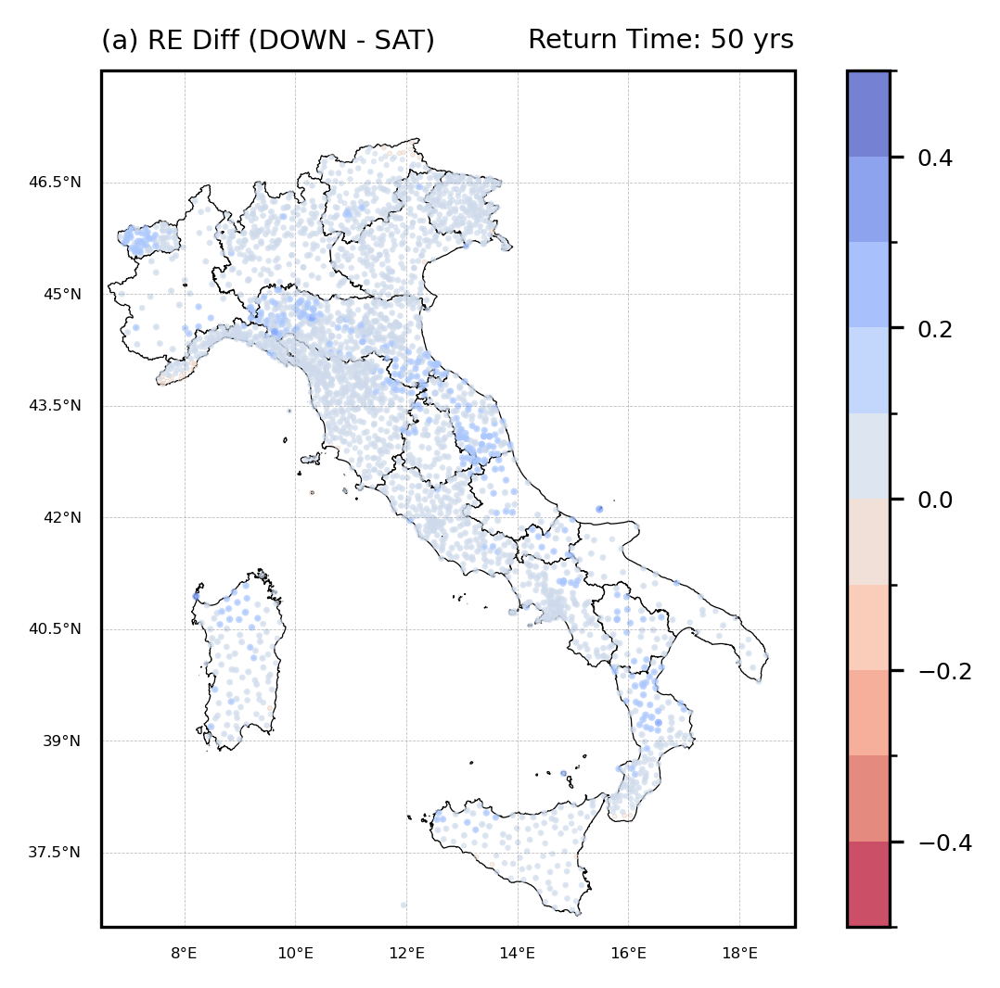

In [55]:
DIFF = (np.array(RE_DOWN_ALL))-(np.array(RE_SAT_ALL))
DIFF_NORM = (DIFF - np.nanmin(DIFF))/(np.nanmax(DIFF) - np.nanmin(DIFF))

proj = ccrs.PlateCarree()

fig = plt.figure(figsize=(6,4),dpi=300)
gs = gridspec.GridSpec(1,1)

# ============================================================================================================================
ax1 = plt.subplot(gs[0, 0], projection = proj)
ax1.set_extent([lon_min, lon_max, lat_min, lat_max], crs=proj)

im = REGIONS_merged.plot(legend=False, color='white', edgecolor="black", linewidth=0.3, ax=ax1)
a1 = ax1.scatter(LON_DOWN_ALL, LAT_DOWN_ALL, c=DIFF, cmap='coolwarm_r', s=DIFF_NORM, alpha=0.7, norm=norm_diff)

gl = ax1.gridlines(crs=proj,draw_labels=True,linewidth=0.2,color='gray',alpha=0.5,linestyle='--')
gl.top_labels = False
gl.bottom_labels = True
gl.right_labels = False
gl.left_labels = True

gl.xlabel_style = {'size': 4, 'color': 'k'}
gl.ylabel_style = {'size': 4, 'color': 'k'}

cbar = plt.colorbar(a1, ax=ax1, fraction=0.056, pad=0.04)
cbar.ax.tick_params(labelsize=6) 

ax1.set_title('(a) RE Diff (DOWN - SAT)', fontsize=7, loc='left')
ax1.set_title('Return Time: 50 yrs', fontsize=7, loc='right')

## Weibull Parameters

In [56]:
dir_in = os.path.join(obs_base, 'DATA_1dy', 'RE_ENSEMBLE_SAT', 'OBS_Weibull_N.csv')
OBS_N = pd.read_csv(dir_in)

dir_in = os.path.join(obs_base, 'DATA_1dy', 'RE_ENSEMBLE_SAT', 'OBS_Weibull_C.csv')
OBS_C = pd.read_csv(dir_in)

dir_in = os.path.join(obs_base, 'DATA_1dy', 'RE_ENSEMBLE_SAT', 'OBS_Weibull_W.csv')
OBS_W = pd.read_csv(dir_in)

In [57]:
dir_in = os.path.join(obs_base, 'DATA_1dy', 'RE_ENSEMBLE_SAT', 'SAT_Weibull_N.csv')
SAT_N = pd.read_csv(dir_in)

dir_in = os.path.join(obs_base, 'DATA_1dy', 'RE_ENSEMBLE_SAT', 'SAT_Weibull_C.csv')
SAT_C = pd.read_csv(dir_in)

dir_in = os.path.join(obs_base, 'DATA_1dy', 'RE_ENSEMBLE_SAT', 'SAT_Weibull_W.csv')
SAT_W = pd.read_csv(dir_in)

In [58]:
dir_in = os.path.join(obs_base, 'DATA_1dy', 'RE_ENSEMBLE_SAT', 'DOWN_Weibull_N.csv')
DOWN_N = pd.read_csv(dir_in)

dir_in = os.path.join(obs_base, 'DATA_1dy', 'RE_ENSEMBLE_SAT', 'DOWN_Weibull_C.csv')
DOWN_C = pd.read_csv(dir_in)

dir_in = os.path.join(obs_base, 'DATA_1dy', 'RE_ENSEMBLE_SAT', 'DOWN_Weibull_W.csv')
DOWN_W = pd.read_csv(dir_in)

In [59]:
OBS_N_data = OBS_N.to_numpy().reshape(-1,1)
SAT_N_data = SAT_N.to_numpy().reshape(-1,1)
DOWN_N_data = DOWN_N.to_numpy().reshape(-1,1)

OBS_C_data = OBS_C.to_numpy().reshape(-1,1)
SAT_C_data = SAT_C.to_numpy().reshape(-1,1)
DOWN_C_data = DOWN_C.to_numpy().reshape(-1,1)

OBS_W_data = OBS_W.to_numpy().reshape(-1,1)
SAT_W_data = SAT_W.to_numpy().reshape(-1,1)
DOWN_W_data = DOWN_W.to_numpy().reshape(-1,1)

In [60]:
N_min = min(np.nanmin(OBS_N_data), np.nanmin(SAT_N_data), np.nanmin(DOWN_N_data))
N_max = max(np.nanmax(OBS_N_data), np.nanmax(SAT_N_data), np.nanmax(DOWN_N_data))

C_min = min(np.nanmin(OBS_C_data), np.nanmin(SAT_C_data), np.nanmin(DOWN_C_data))
C_max = max(np.nanmax(OBS_C_data), np.nanmax(SAT_C_data), np.nanmax(DOWN_C_data))

W_min = min(np.nanmin(OBS_W_data), np.nanmin(SAT_W_data), np.nanmin(DOWN_W_data))
W_max = max(np.nanmax(OBS_W_data), np.nanmax(SAT_W_data), np.nanmax(DOWN_W_data))

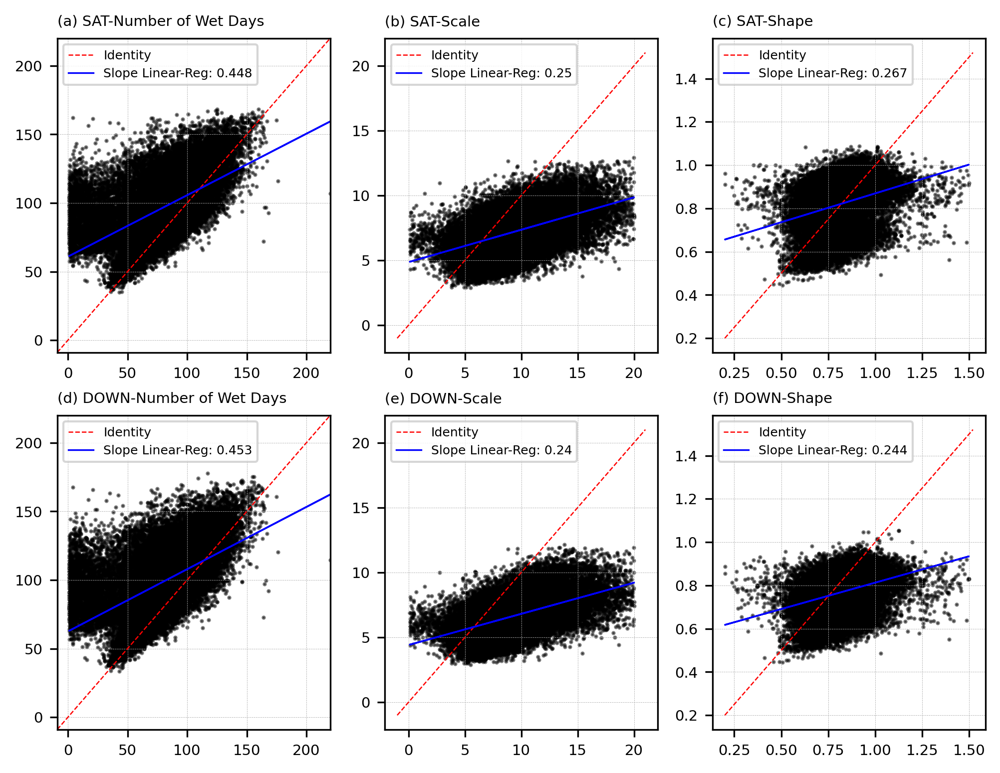

In [61]:
fig = plt.figure(figsize=(8,6),dpi=300)
gs = gridspec.GridSpec(2,3)

# ============================================================================================================================
ax1 = plt.subplot(gs[0, 0])
ax1.scatter(OBS_N_data[~np.isnan(OBS_N_data)], SAT_N_data[~np.isnan(OBS_N_data)], color='k', s=1, alpha=0.5)
ax1.plot([N_min-10, N_max], [N_min-10, N_max], color='r', linestyle='--', linewidth=0.6, label='Identity')

x_in = OBS_N_data[~np.isnan(OBS_N_data)]
y_in = SAT_N_data[~np.isnan(OBS_N_data)]
slope, intercept, r_value, p_value, std_err = stats.linregress(x_in,y_in)
x_vals = np.array(x_in)
y_vals = intercept + slope * x_vals
ax1.plot(x_vals, y_vals, color='blue', linewidth=0.8, label=f'Slope Linear-Reg: {np.round(slope,3)}')

ax1.grid(linewidth=0.2, linestyle='--')
ax1.set_xlim(N_min-10, N_max)
ax1.set_ylim(N_min-10, N_max)
ax1.tick_params(axis='both', which='major', labelsize=7)
ax1.set_title('(a) SAT-Number of Wet Days', loc='left', fontsize=7)
ax1.legend(fontsize=6)

# ============================================================================================================================
val_max = 20
ax1 = plt.subplot(gs[0, 1])
ax1.scatter(OBS_C_data[OBS_C_data<val_max], SAT_C_data[OBS_C_data<val_max], color='k', s=1, alpha=0.5)
ax1.plot([-1, 21], [-1, 21], color='r', linestyle='--', linewidth=0.6, label='Identity')

x_in = OBS_C_data[OBS_C_data<val_max]
y_in = SAT_C_data[OBS_C_data<val_max]
slope, intercept, r_value, p_value, std_err = stats.linregress(x_in,y_in)
x_vals = np.array(x_in)
y_vals = intercept + slope * x_vals
ax1.plot(x_vals, y_vals, color='blue', linewidth=0.8, label=f'Slope Linear-Reg: {np.round(slope,3)}')

ax1.grid(linewidth=0.2, linestyle='--')
ax1.tick_params(axis='both', which='major', labelsize=7)
ax1.set_title('(b) SAT-Scale', loc='left', fontsize=7)
ax1.legend(fontsize=6)

# ============================================================================================================================
val_max = 1.5
ax1 = plt.subplot(gs[0, 2])
ax1.scatter(OBS_W_data[OBS_W_data<val_max], SAT_W_data[OBS_W_data<val_max], color='k', s=1, alpha=0.5)
ax1.plot([0.2, 1.52], [0.2, 1.52], color='r', linestyle='--', linewidth=0.6, label='Identity')

x_in = OBS_W_data[OBS_W_data<val_max]
y_in = SAT_W_data[OBS_W_data<val_max]
slope, intercept, r_value, p_value, std_err = stats.linregress(x_in,y_in)
x_vals = np.array(x_in)
y_vals = intercept + slope * x_vals
ax1.plot(x_vals, y_vals, color='blue', linewidth=0.8, label=f'Slope Linear-Reg: {np.round(slope,3)}')

ax1.grid(linewidth=0.2, linestyle='--')
ax1.tick_params(axis='both', which='major', labelsize=7)
ax1.set_title('(c) SAT-Shape', loc='left', fontsize=7)
ax1.legend(fontsize=6)

# ============================================================================================================================
ax1 = plt.subplot(gs[1, 0])
ax1.scatter(OBS_N_data[~np.isnan(OBS_N_data)], DOWN_N_data[~np.isnan(OBS_N_data)], color='k', s=1, alpha=0.5)
ax1.plot([N_min-10, N_max], [N_min-10, N_max], color='r', linestyle='--', linewidth=0.6, label='Identity')

x_in = OBS_N_data[~np.isnan(OBS_N_data)]
y_in = DOWN_N_data[~np.isnan(OBS_N_data)]
slope, intercept, r_value, p_value, std_err = stats.linregress(x_in,y_in)
x_vals = np.array(x_in)
y_vals = intercept + slope * x_vals
ax1.plot(x_vals, y_vals, color='blue', linewidth=0.8, label=f'Slope Linear-Reg: {np.round(slope,3)}')

ax1.grid(linewidth=0.2, linestyle='--')
ax1.set_xlim(N_min-10, N_max)
ax1.set_ylim(N_min-10, N_max)
ax1.tick_params(axis='both', which='major', labelsize=7)
ax1.set_title('(d) DOWN-Number of Wet Days', loc='left', fontsize=7)
ax1.legend(fontsize=6)

# ============================================================================================================================
val_max = 20
ax1 = plt.subplot(gs[1, 1])
ax1.scatter(OBS_C_data[OBS_C_data<val_max], DOWN_C_data[OBS_C_data<val_max], color='k', s=1, alpha=0.5)
ax1.plot([-1, 21], [-1, 21], color='r', linestyle='--', linewidth=0.6, label='Identity')

x_in = OBS_C_data[OBS_C_data<val_max]
y_in = DOWN_C_data[OBS_C_data<val_max]
slope, intercept, r_value, p_value, std_err = stats.linregress(x_in,y_in)
x_vals = np.array(x_in)
y_vals = intercept + slope * x_vals
ax1.plot(x_vals, y_vals, color='blue', linewidth=0.8, label=f'Slope Linear-Reg: {np.round(slope,3)}')

ax1.grid(linewidth=0.2, linestyle='--')
ax1.tick_params(axis='both', which='major', labelsize=7)
ax1.set_title('(e) DOWN-Scale', loc='left', fontsize=7)
ax1.legend(fontsize=6)

# ============================================================================================================================
val_max = 1.5
ax1 = plt.subplot(gs[1, 2])
ax1.scatter(OBS_W_data[OBS_W_data<val_max], DOWN_W_data[OBS_W_data<val_max], color='k', s=1, alpha=0.5)
ax1.plot([0.2, 1.52], [0.2, 1.52], color='r', linestyle='--', linewidth=0.6, label='Identity')

x_in = OBS_W_data[OBS_W_data<val_max]
y_in = DOWN_W_data[OBS_W_data<val_max]
slope, intercept, r_value, p_value, std_err = stats.linregress(x_in,y_in)
x_vals = np.array(x_in)
y_vals = intercept + slope * x_vals
ax1.plot(x_vals, y_vals, color='blue', linewidth=0.8, label=f'Slope Linear-Reg: {np.round(slope,3)}')

ax1.grid(linewidth=0.2, linestyle='--')
ax1.tick_params(axis='both', which='major', labelsize=7)
ax1.set_title('(f) DOWN-Shape', loc='left', fontsize=7)
ax1.legend(fontsize=6)

## Comparison between DOWN and the raw SATELLITE products

In [62]:
dir_in = os.path.join(obs_base, 'DATA_1dy', 'RE_ENSEMBLE_SAT', f'OBS_relative_error_lat.csv')
OBS_RE_LAT = pd.read_csv(dir_in)

dir_in = os.path.join(obs_base, 'DATA_1dy', 'RE_ENSEMBLE_SAT', f'OBS_relative_error_lon.csv')
OBS_RE_LON = pd.read_csv(dir_in)

In [63]:
dir_in = os.path.join(obs_base, 'DATA_1dy', 'RE_ENSEMBLE_SAT', f'SAT_relative_error.csv')
SAT_RE = pd.read_csv(dir_in)

dir_in = os.path.join(obs_base, 'DATA_1dy', 'RE_ENSEMBLE_SAT', f'DOWN_relative_error.csv')
DOWN_RE = pd.read_csv(dir_in)

dir_in = os.path.join(obs_base, 'DATA_1dy', 'RE_ENSEMBLE_SAT', f'DOWN_CMORPH_relative_error.csv')
CMORPH_RE = pd.read_csv(dir_in)

dir_in = os.path.join(obs_base, 'DATA_1dy', 'RE_ENSEMBLE_SAT', f'DOWN_ERA5_relative_error.csv')
ERA5_RE = pd.read_csv(dir_in)

dir_in = os.path.join(obs_base, 'DATA_1dy', 'RE_ENSEMBLE_SAT', f'DOWN_GSMaP_relative_error.csv')
GSMaP_RE = pd.read_csv(dir_in)

dir_in = os.path.join(obs_base, 'DATA_1dy', 'RE_ENSEMBLE_SAT', f'DOWN_MSWEP_relative_error.csv')
MSWEP_RE = pd.read_csv(dir_in)

dir_in = os.path.join(obs_base, 'DATA_1dy', 'RE_ENSEMBLE_SAT', f'DOWN_IMERG_relative_error.csv')
IMERG_RE = pd.read_csv(dir_in)

dir_in = os.path.join(obs_base, 'DATA_1dy', 'RE_ENSEMBLE_SAT', f'DOWN_CHIRPS_relative_error.csv')
CHIRPS_RE = pd.read_csv(dir_in)

In [64]:
OBS_RE_LAT = OBS_RE_LAT[~np.isnan(OBS_Q50)]
OBS_RE_LON = OBS_RE_LON[~np.isnan(OBS_Q50)]

SAT_RE = SAT_RE[~np.isnan(OBS_Q50)]
DOWN_RE = DOWN_RE[~np.isnan(OBS_Q50)]

CMORPH_RE = CMORPH_RE[~np.isnan(OBS_Q50)]
ERA5_RE = ERA5_RE[~np.isnan(OBS_Q50)]
GSMaP_RE = GSMaP_RE[~np.isnan(OBS_Q50)]
MSWEP_RE = MSWEP_RE[~np.isnan(OBS_Q50)]
IMERG_RE = IMERG_RE[~np.isnan(OBS_Q50)]
CHIRPS_RE = CHIRPS_RE[~np.isnan(OBS_Q50)]

In [65]:
SAT_RE_M = SAT_RE.values.flatten()
DOWN_RE_M = DOWN_RE.values.flatten()

CMORPH_RE_M = CMORPH_RE.values.flatten()
ERA5_RE_M = ERA5_RE.values.flatten()
GSMaP_RE_M = GSMaP_RE.values.flatten()
MSWEP_RE_M = MSWEP_RE.values.flatten()
IMERG_RE_M = IMERG_RE.values.flatten()
CHIRPS_RE_M = CHIRPS_RE.values.flatten()

In [66]:
colors = ['royalblue','r', 'g', 'c', 'y', 'purple', 'orange', 'cyan']

Text(0.5, 1.0, 'Tr = 50 yrs')

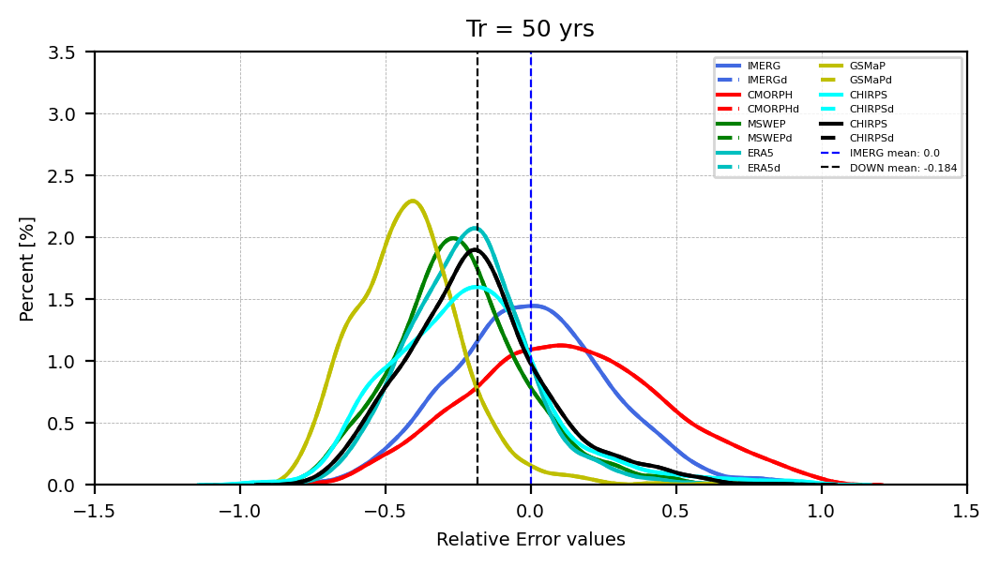

In [ ]:
fig = plt.figure(figsize=(6,3),dpi=200)
gs = gridspec.GridSpec(1,1)

# =========================================================================================================================
ax1 = plt.subplot(gs[0, 0])

sns.kdeplot(IMERG_RE_M,color=colors[0],cumulative=False,fill=False,multiple="stack",ax=ax1,label=f'IMERG')
sns.kdeplot(IMERG_RE_M,color=colors[0], linestyle='--',cumulative=False,fill=False,multiple="stack",ax=ax1,label=f'IMERGd')

sns.kdeplot(CMORPH_RE_M,color=colors[1],cumulative=False,fill=False,multiple="stack",ax=ax1,label=f'CMORPH')
sns.kdeplot(CMORPH_RE_M,color=colors[1], linestyle='--',cumulative=False,fill=False,multiple="stack",ax=ax1,label=f'CMORPHd')

sns.kdeplot(MSWEP_RE_M,color=colors[2],cumulative=False,fill=False,multiple="stack",ax=ax1,label=f'MSWEP')
sns.kdeplot(MSWEP_RE_M,color=colors[2], linestyle='--',cumulative=False,fill=False,multiple="stack",ax=ax1,label=f'MSWEPd')

sns.kdeplot(ERA5_RE_M,color=colors[3],cumulative=False,fill=False,multiple="stack",ax=ax1,label=f'ERA5')
sns.kdeplot(ERA5_RE_M,color=colors[3], linestyle='--',cumulative=False,fill=False,multiple="stack",ax=ax1,label=f'ERA5d')

sns.kdeplot(GSMaP_RE_M,color=colors[4],cumulative=False,fill=False,multiple="stack",ax=ax1,label=f'GSMaP')
sns.kdeplot(GSMaP_RE_M,color=colors[4], linestyle='--',cumulative=False,fill=False,multiple="stack",ax=ax1,label=f'GSMaPd')

sns.kdeplot(CHIRPS_RE_M,color=colors[7],cumulative=False,fill=False,multiple="stack",ax=ax1,label=f'CHIRPS')
sns.kdeplot(CHIRPS_RE_M,color=colors[7], linestyle='--',cumulative=False,fill=False,multiple="stack",ax=ax1,label=f'CHIRPSd')

sns.kdeplot(DOWN_RE_M,color='k',cumulative=False,fill=False,multiple="stack",ax=ax1,label=f'ENSEMBLE SAT')
sns.kdeplot(DOWN_RE_M,color='k', linestyle='--',cumulative=False,fill=False,multiple="stack",ax=ax1,label=f'ENSEMBLEd')

ax1.axvline(np.nanmean(IMERG_RE_M),color='b',linestyle='--',linewidth=0.8, label=f'IMERG mean: {np.round(np.nanmean(IMERG_RE_M),3)}')
ax1.axvline(np.nanmean(DOWN_RE_M),color='k',linestyle='--',linewidth=0.8, label=f'DOWN mean: {np.round(np.nanmean(DOWN_RE_M),3)}')

ax1.set_ylabel('Percent [%]',fontsize=7)
ax1.set_xlabel('Relative Error values',fontsize=7)
ax1.legend(fontsize=4, loc=0, ncol=2)
ax1.grid(linewidth=0.3, linestyle='--')
ax1.set_xlim(-1.5,1.5)
ax1.set_ylim(0,3.5)
ax1.tick_params(axis='both', which='major', labelsize=7)
ax1.set_title(f'Tr = 50 yrs',fontsize=9, loc='Center')

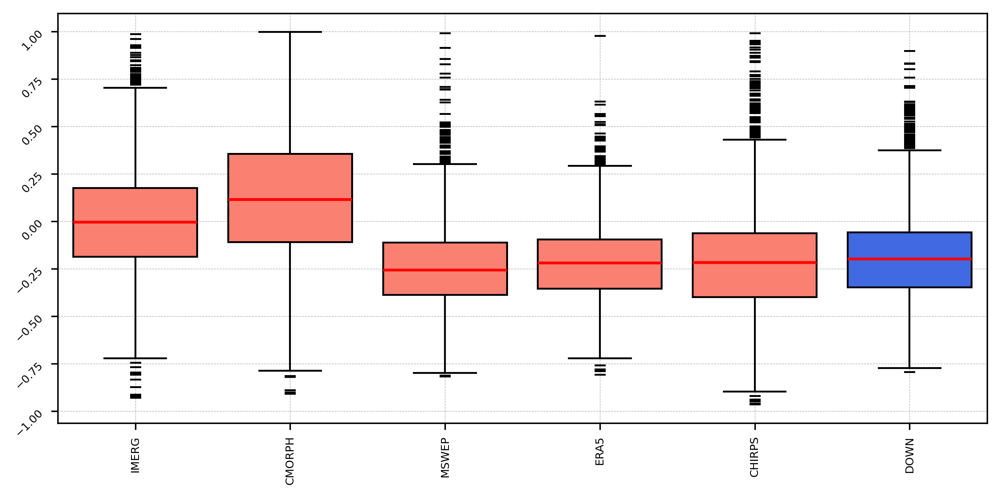

In [68]:
box_width = 0.8
x_pos = np.arange(0.5,42,2)

fig = plt.figure(figsize=(9,4),dpi=300)
gs = gridspec.GridSpec(1,1)

# ============================================================================================================================
ax1 = plt.subplot(gs[0, 0])

SAT_boxprops = dict(facecolor='salmon')
DOWN_boxprops = dict(facecolor='royalblue')

meanprops=dict(linestyle='-',color="g",linewidth=1.5)
flierprops = dict(marker='_',markeredgecolor='k',linewidth=1.5)
medianprops = dict(linestyle='-', linewidth=1.5, color='r')

SAT_boxes = []
DOWN_boxes = []
medians = []
fliers = []

SAT_tmp = IMERG_RE_M
SAT_tmp = SAT_tmp[~np.isnan(SAT_tmp)]
SAT_box = ax1.boxplot(SAT_tmp,positions=[0],
widths=box_width,boxprops=SAT_boxprops,
showmeans=False,meanline=True,meanprops=meanprops,
medianprops=medianprops,
showfliers=True,flierprops=flierprops,
patch_artist=True,notch=False)

SAT_tmp = CMORPH_RE_M
SAT_tmp = SAT_tmp[~np.isnan(SAT_tmp)]
SAT_box = ax1.boxplot(SAT_tmp,positions=[1],
widths=box_width,boxprops=SAT_boxprops,
showmeans=False,meanline=True,meanprops=meanprops,
medianprops=medianprops,
showfliers=True,flierprops=flierprops,
patch_artist=True,notch=False)

SAT_tmp = MSWEP_RE_M
SAT_tmp = SAT_tmp[~np.isnan(SAT_tmp)]
SAT_box = ax1.boxplot(SAT_tmp,positions=[2],
widths=box_width,boxprops=SAT_boxprops,
showmeans=False,meanline=True,meanprops=meanprops,
medianprops=medianprops,
showfliers=True,flierprops=flierprops,
patch_artist=True,notch=False)

SAT_tmp = ERA5_RE_M
SAT_tmp = SAT_tmp[~np.isnan(SAT_tmp)]
SAT_box = ax1.boxplot(SAT_tmp,positions=[3],
widths=box_width,boxprops=SAT_boxprops,
showmeans=False,meanline=True,meanprops=meanprops,
medianprops=medianprops,
showfliers=True,flierprops=flierprops,
patch_artist=True,notch=False)

SAT_tmp = CHIRPS_RE_M
SAT_tmp = SAT_tmp[~np.isnan(SAT_tmp)]
SAT_box = ax1.boxplot(SAT_tmp,positions=[4],
widths=box_width,boxprops=SAT_boxprops,
showmeans=False,meanline=True,meanprops=meanprops,
medianprops=medianprops,
showfliers=True,flierprops=flierprops,
patch_artist=True,notch=False)

SAT_tmp = DOWN_RE_M
SAT_tmp = SAT_tmp[~np.isnan(SAT_tmp)]
SAT_box = ax1.boxplot(SAT_tmp,positions=[5],
widths=box_width,boxprops=DOWN_boxprops,
showmeans=False,meanline=True,meanprops=meanprops,
medianprops=medianprops,
showfliers=True,flierprops=flierprops,
patch_artist=True,notch=False)

ax1.set_xticks(np.arange(6))
ax1.set_xticklabels(['IMERG','CMORPH','MSWEP','ERA5','CHIRPS','DOWN'], fontsize=8)

ax1.grid(linewidth=0.3, linestyle='--')
ax1.tick_params(axis='both', which='major', labelsize=6, labelrotation=90)
ax1.tick_params(axis='y', which='major', labelsize=6, rotation=45)